In [1]:
import itertools
import pandas as pd
import numpy as np
from random import gauss

import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller

from pandas.plotting import autocorrelation_plot
from sklearn.metrics import mean_squared_error
from sklearn.feature_selection import RFECV
from sklearn.linear_model import Ridge

import warnings
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

from dateutil.easter import easter
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics
from prophet.plot import plot_yearly, add_changepoints_to_plot

import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import plotly.graph_objects as go

/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
class CFG:
    data_folder = 'datasets/'
    img_dim1 = 15
    img_dim2 = 7
    
plt.rcParams.update({'figure.figsize':(CFG.img_dim1, CFG.img_dim2)})

US Covid Data

<AxesSubplot: >

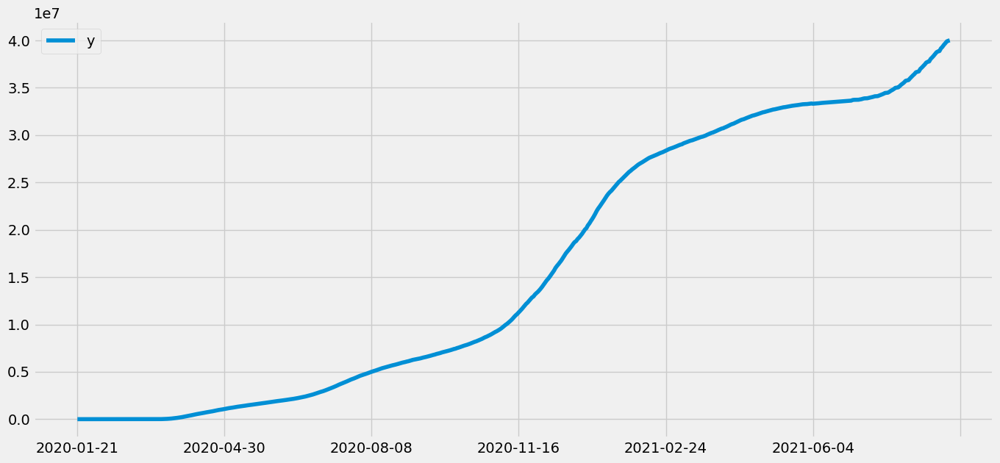

In [3]:
df = pd.read_csv(CFG.data_folder+'us_covid.csv')
df.head()
xdat = df[["date", "cases"]].rename(columns={"date":"ds", "cases": "y"})
xdat.set_index('ds').plot(figsize=(CFG.img_dim1,CFG.img_dim2), xlabel='')

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -7.77935
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2159.64    0.00983089       2049.72           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2228.16    0.00221096       320.671           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2248.98    0.00144184       747.774           1           1      365   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        2255.4   0.000309442       189.197      0.4508      0.4508      476   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       2260.28   0.000849992       384.468      0.5639      0.5639      591   
    Iter      log prob        ||dx||      ||grad||       alpha  

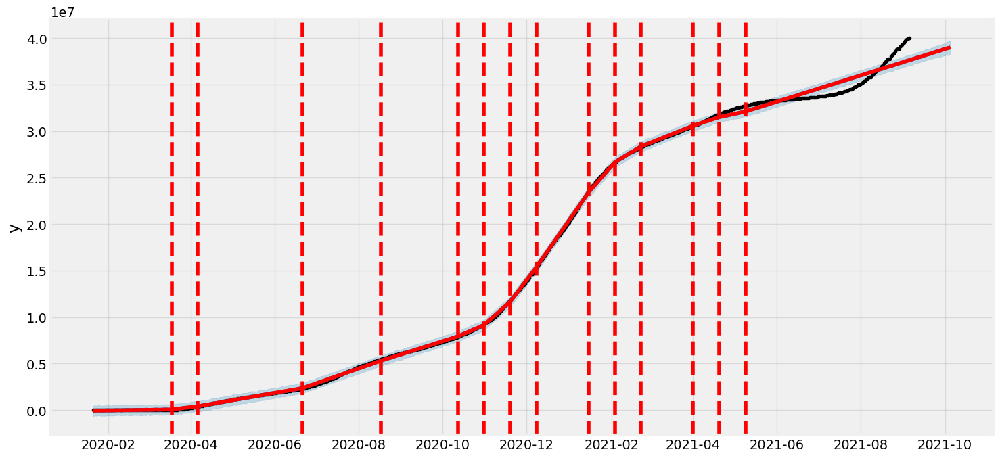

In [4]:
m = Prophet()
m.fit(xdat)
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig = m.plot(forecast, figsize=(CFG.img_dim1,CFG.img_dim2), xlabel='')
a = add_changepoints_to_plot(fig.gca(), m, forecast)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -7.77935
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1749.12    0.00189536       2253.42      0.1684      0.1684      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     194       1813.93   0.000461871       1402.44   7.218e-07       0.001      290  LS failed, Hessian reset 
     199       1815.31     0.0038201       1129.69           1           1      295   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1836.94   0.000180292       741.325      0.4367      0.4367      414   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       1843.14    0.00325652       319.604           1           1      541   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     403       1843.46   0.000103507    

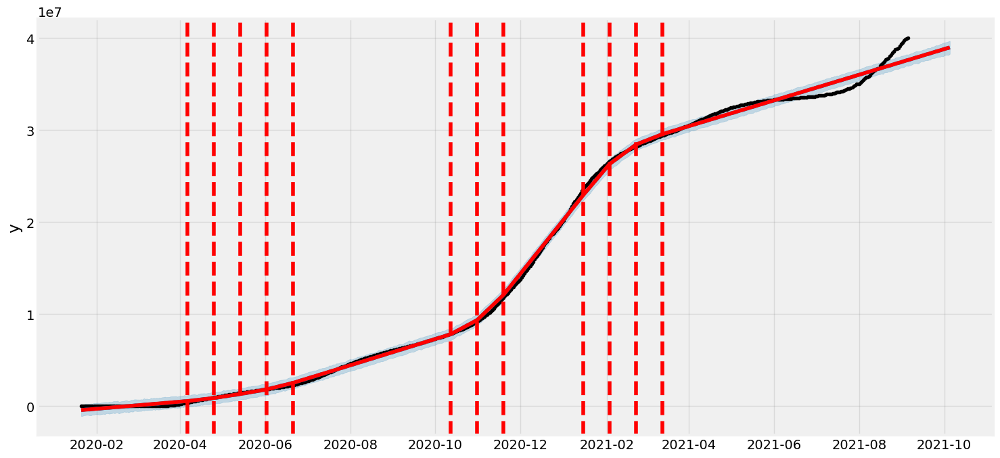

In [5]:
m = Prophet(changepoint_prior_scale=0.01)
m.fit(xdat)
future = m.make_future_dataframe(periods=30)
forecast = m.predict(future)
fig = m.plot(forecast, figsize=(CFG.img_dim1,CFG.img_dim2), xlabel='')
a = add_changepoints_to_plot(fig.gca(), m, forecast)

<AxesSubplot: xlabel='ds'>

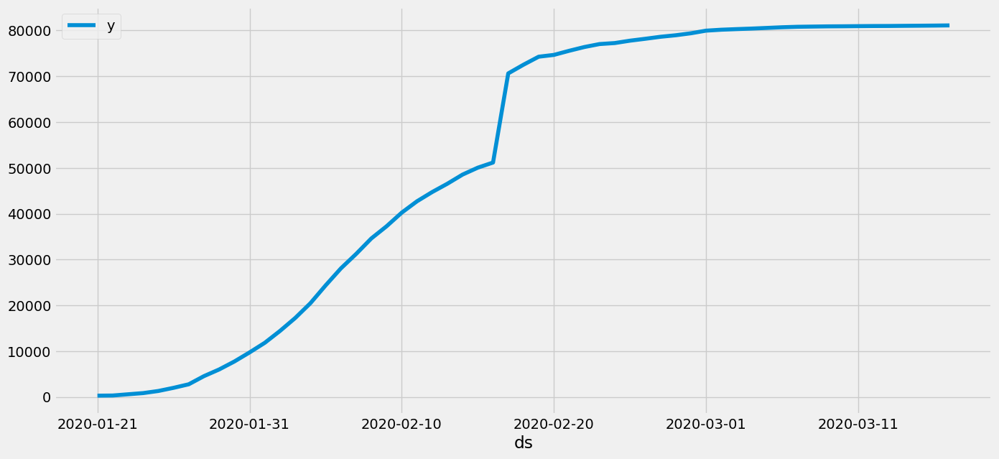

In [6]:
df = pd.read_csv(CFG.data_folder+"WHO_full_data2003.csv")
df = df.loc[df["location"] == "China"][["date", "total_cases"]].rename(columns={"date":"ds", "total_cases":"y"})
df.set_index("ds").plot(figsize=(CFG.img_dim1, CFG.img_dim2))

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



Initial log joint probability = -24.7844
Iteration  1. Log joint probability =    11.6334. Improved by 36.4178.
Iteration  2. Log joint probability =    15.4864. Improved by 3.85299.
Iteration  3. Log joint probability =    42.6951. Improved by 27.2086.
Iteration  4. Log joint probability =    42.6997. Improved by 0.00469238.
Iteration  5. Log joint probability =    42.7139. Improved by 0.0142003.
Iteration  6. Log joint probability =    42.7421. Improved by 0.0281619.
Iteration  7. Log joint probability =    42.7567. Improved by 0.0146154.
Iteration  8. Log joint probability =    42.7846. Improved by 0.0278468.
Iteration  9. Log joint probability =    42.7881. Improved by 0.00348525.
Iteration 10. Log joint probability =    42.7945. Improved by 0.00649282.
Iteration 11. Log joint probability =    42.7978. Improved by 0.00324858.
Iteration 12. Log joint probability =    42.8452. Improved by 0.0474326.
Iteration 13. Log joint probability =    42.8571. Improved by 0.0118655.
Iteration 1

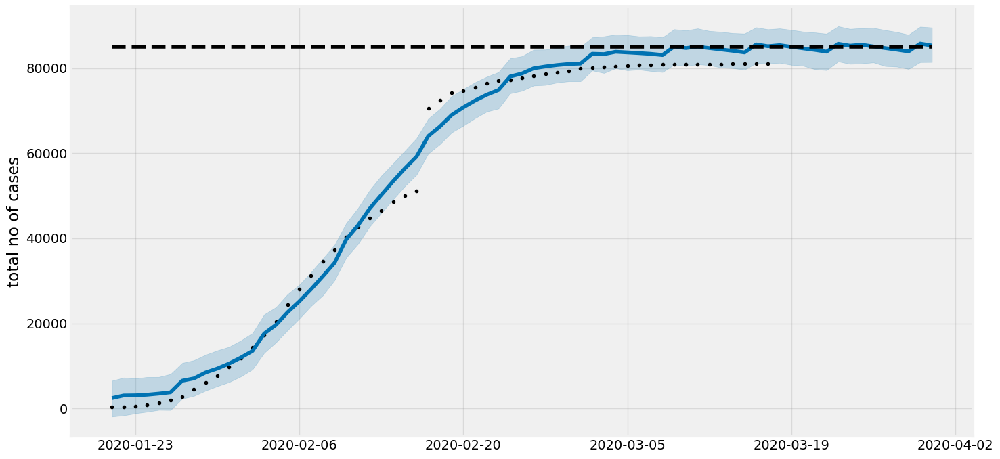

In [7]:
df['cap'] = 85000
m = Prophet(growth='logistic')
m.fit(df)
future = m.make_future_dataframe(periods=14)
future["cap"] = 85000
fcst = m.predict(future)
fig = m.plot(fcst, figsize=(CFG.img_dim1, CFG.img_dim2), xlabel='', ylabel="total no of cases")

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



Initial log joint probability = -24.7844
Iteration  1. Log joint probability =    11.6334. Improved by 36.4178.
Iteration  2. Log joint probability =    15.4864. Improved by 3.85299.
Iteration  3. Log joint probability =    42.6951. Improved by 27.2086.
Iteration  4. Log joint probability =    42.6997. Improved by 0.00469238.
Iteration  5. Log joint probability =    42.7139. Improved by 0.0142003.
Iteration  6. Log joint probability =    42.7421. Improved by 0.0281619.
Iteration  7. Log joint probability =    42.7567. Improved by 0.0146154.
Iteration  8. Log joint probability =    42.7846. Improved by 0.0278468.
Iteration  9. Log joint probability =    42.7881. Improved by 0.00348525.
Iteration 10. Log joint probability =    42.7945. Improved by 0.00649282.
Iteration 11. Log joint probability =    42.7978. Improved by 0.00324858.
Iteration 12. Log joint probability =    42.8452. Improved by 0.0474326.
Iteration 13. Log joint probability =    42.8571. Improved by 0.0118655.
Iteration 1

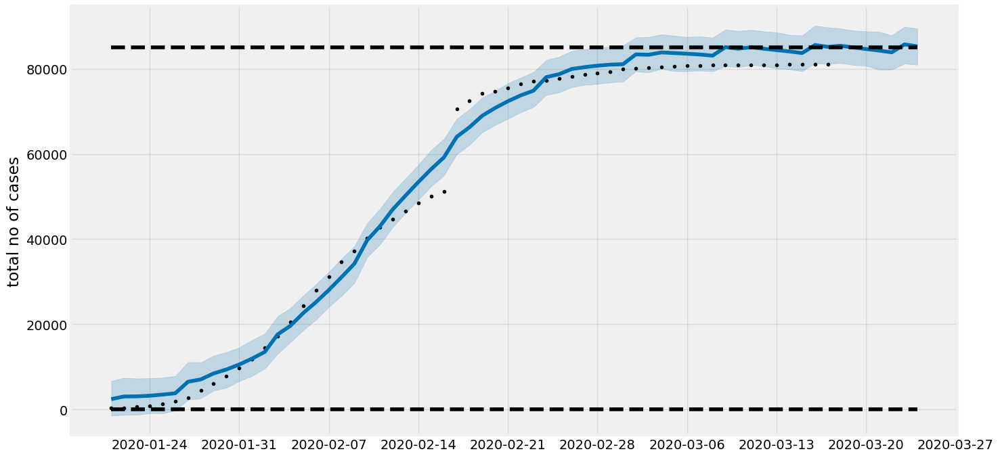

In [10]:
df["cap"] = 85000
df["floor"] = 0

m = Prophet(growth='logistic')
m.fit(df)

future = m.make_future_dataframe(periods=7)
future['cap'] = 85000
future['floor'] = 0
fcst = m.predict(future)
fig = m.plot(fcst, figsize=(CFG.img_dim1, CFG.img_dim2), xlabel='', ylabel="total no of cases")

### Seasonality Example with Prophet

<AxesSubplot: xlabel='ds'>

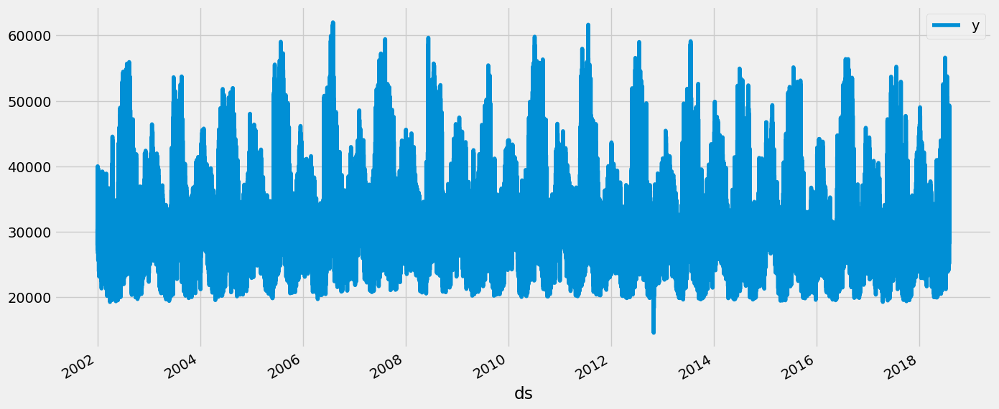

In [8]:
df = pd.read_csv('datasets/pjm_hourly_est.csv')
df['Datetime'] = pd.to_datetime(df['Datetime'])
xdat = df[["Datetime", "PJME"]]
first_valid = np.where(~np.isnan(xdat['PJME']))[0][0]
xdat = xdat.loc[first_valid:].rename(columns={'Datetime':'ds', 'PJME':'y'})
xdat.set_index('ds').plot(figsize=(CFG.img_dim1, CFG.img_dim2))

Initial log joint probability = -200.673
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       70819.1    0.00578355       3410.18           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       70922.4   0.000894652       1344.05      0.3951      0.3951      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       70982.9    0.00564091       579.062           1           1      354   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       71042.3    0.00330371       1748.66      0.9424      0.9424      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       71071.1     0.0504611       6033.88           1           1      572   
    Iter      log prob        ||dx||      ||grad||       alpha  

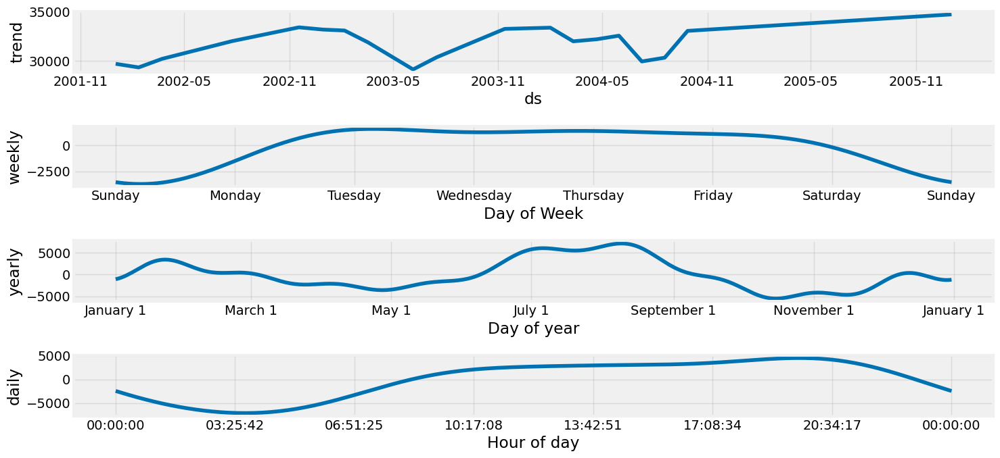

In [9]:
m = Prophet().fit(xdat.iloc[:30000])
future = m.make_future_dataframe(periods = 24, freq= "H")
forecast = m.predict(future)
m.plot_components(forecast, figsize=(CFG.img_dim1, CFG.img_dim2))
print()

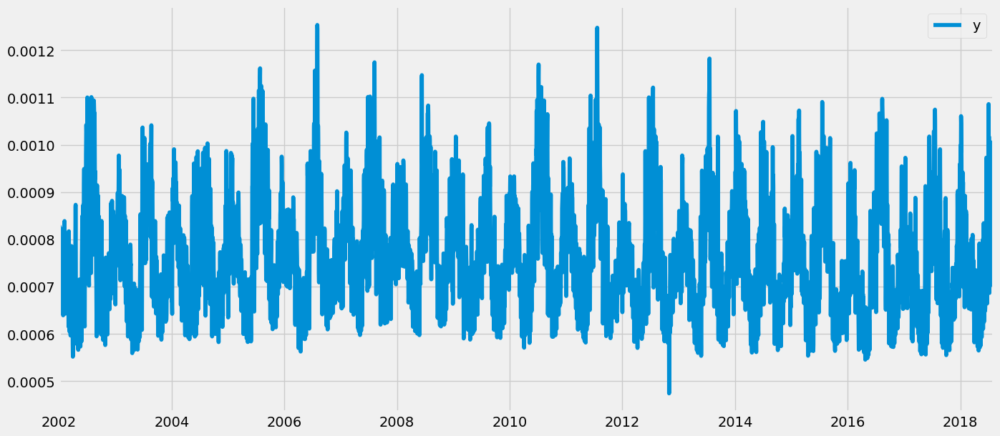

In [10]:
xdat = df.resample('D', on='Datetime').sum().reset_index()[["Datetime", "PJME"]].rename(columns={"Datetime": "ds", "PJME":"y"})
xdat["y"]/= 1e9
ix=np.where(xdat['y'] > 0)[0][0]
xdat = xdat.iloc[ix:-1]
xdat.set_index('ds').plot(xlabel = '')
print()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -45.4112
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       14516.1    0.00307894       306.941           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     163       14518.2   2.79802e-05       88.0686   2.217e-07       0.001      254  LS failed, Hessian reset 
     195       14518.3   4.58531e-05       149.112   4.172e-07       0.001      338  LS failed, Hessian reset 
     199       14518.3   0.000135833       89.3617           1           1      342   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     271       14518.8   2.56044e-05       90.1695   2.327e-07       0.001      478  LS failed, Hessian reset 
     299       14518.9   0.000245229       97.0863           1           1      511   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

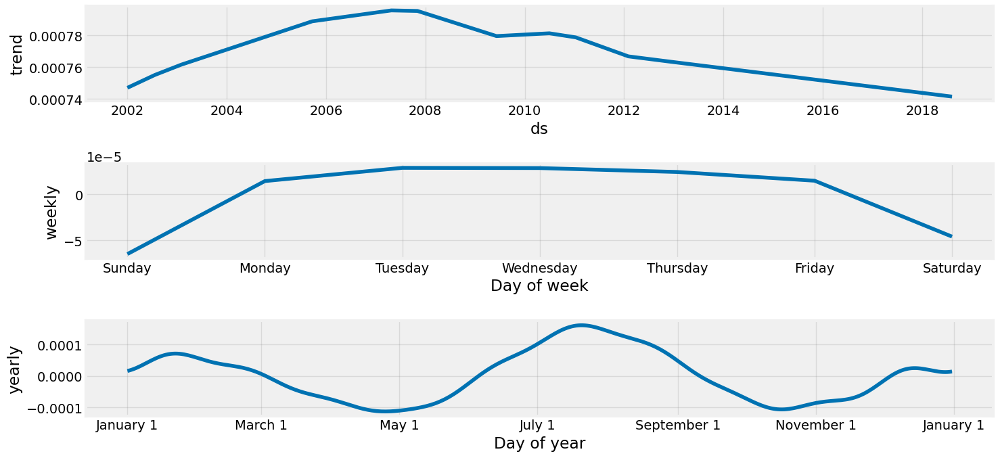

In [17]:
m = Prophet().fit(xdat)
future = m.make_future_dataframe(periods = 7, freq= "D")
forecast = m.predict(future)
m.plot_components(forecast, figsize=(CFG.img_dim1, CFG.img_dim2))
print()

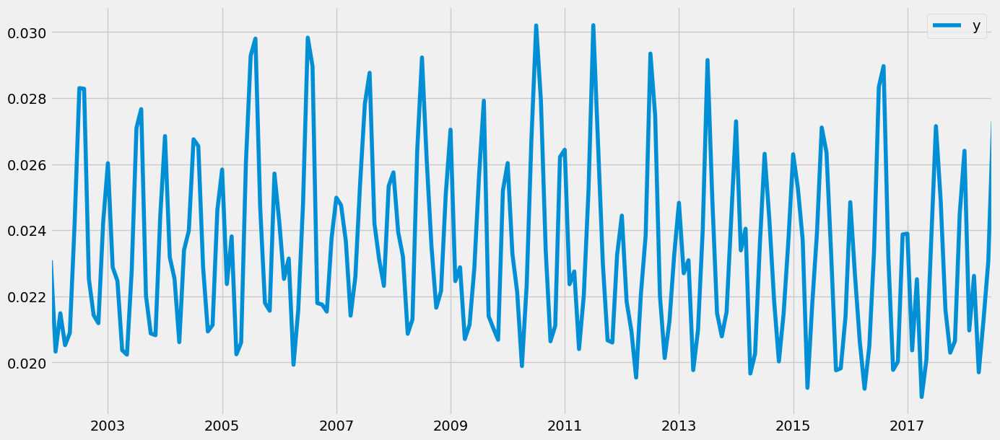

In [11]:
xdat = df.resample('M', on='Datetime').sum().reset_index()[["Datetime", "PJME"]].rename(columns={"Datetime": "ds", "PJME":"y"})
xdat["y"]/= 1e9
ix=np.where(xdat['y'] > 0)[0][0]
xdat = xdat.iloc[ix:-1]
xdat.set_index('ds').plot(xlabel = '')
print()

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -3.38019
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       582.672    0.00121559       80.4755      0.5276      0.5276      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     154       582.726   2.70459e-06       76.1663   3.555e-08       0.001      227  LS failed, Hessian reset 
     177       582.726   1.49055e-08        61.948      0.1987      0.7601      259   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance



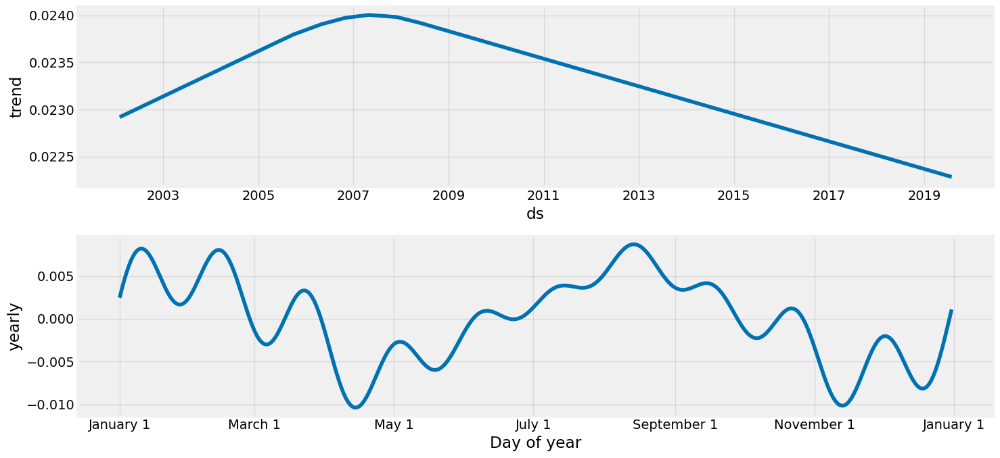

In [12]:
m = Prophet().fit(xdat)
future = m.make_future_dataframe(periods = 12, freq= "M")
forecast = m.predict(future)
m.plot_components(forecast, figsize=(CFG.img_dim1, CFG.img_dim2))
print()

In [14]:
df = pd.read_csv('datasets/AirPassengers.csv')
df = df.rename(columns={'Month':'ds', '#Passengers':'y'})
df['ds'] = pd.to_datetime(df['ds'])
df

,ds,y
0,1949-01-01,112
1,1949-02-01,118
2,1949-03-01,132
3,1949-04-01,129
4,1949-05-01,121
...,...,...
139,1960-08-01,606
140,1960-09-01,508
141,1960-10-01,461
142,1960-11-01,390


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.46502
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        401.66   1.78716e-05       55.4735           1           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       401.844   0.000119314       84.8969      0.3647      0.3647      262   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     236       401.931    0.00024899       75.7197   4.853e-06       0.001      368  LS failed, Hessian reset 
     292        401.97   2.42975e-05       70.8311   3.015e-07       0.001      472  LS failed, Hessian reset 
     299       401.971   7.21159e-07       61.2634      0.3319           1      483   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     362       401.973     2.209e-05       92.3827   2.147e-07       0.001      617  LS failed, Hessian rese

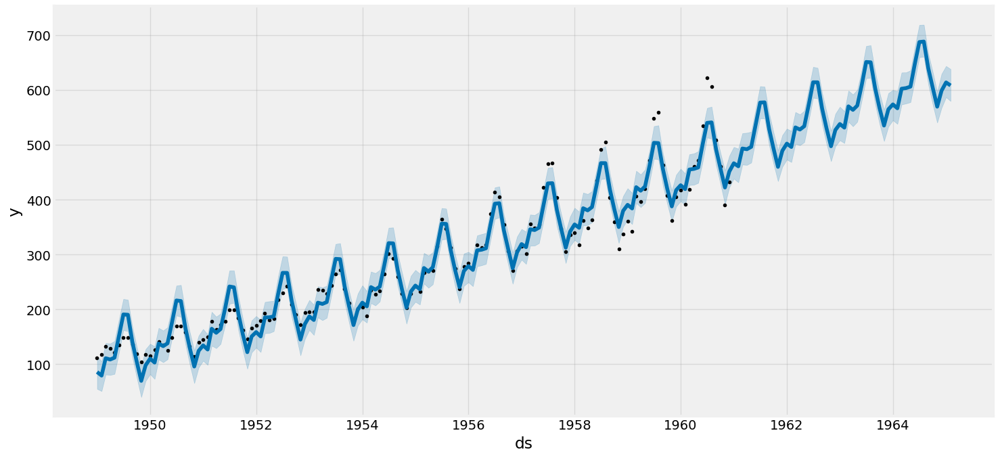

In [15]:
m = Prophet(seasonality_mode='additive')
m.fit(df)
future = m.make_future_dataframe(50, freq='MS')
forecast = m.predict(future)
m.plot(forecast, figsize=(CFG.img_dim1, CFG.img_dim2))
print()

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.46502
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       501.337    0.00248704       198.009           1           1      140   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       503.244   0.000227812       77.8164           1           1      263   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       503.428   0.000217002       72.4103           1           1      392   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     313       503.514   0.000294615       131.978   3.143e-06       0.001      465  LS failed, Hessian reset 
     359       503.534    9.2978e-09       69.2829      0.1696      0.1696      533   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance



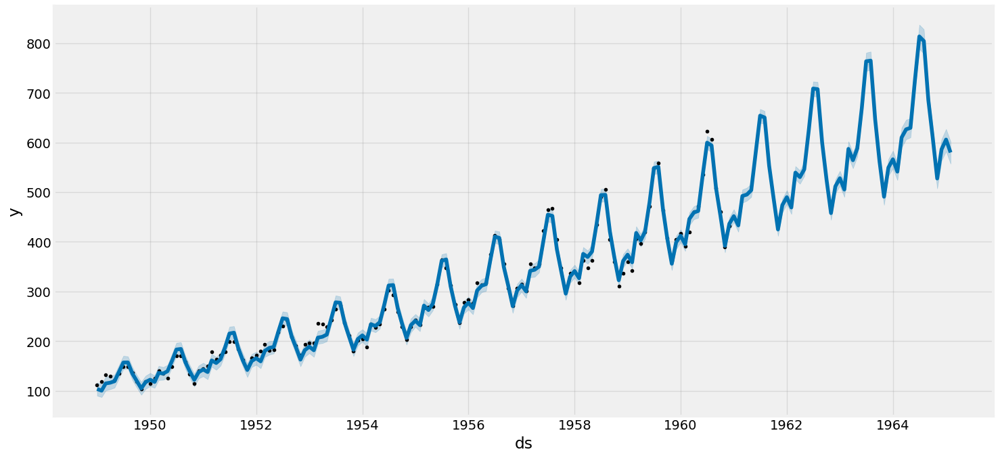

In [16]:
m = Prophet(seasonality_mode='multiplicative')
m.fit(df)
future = m.make_future_dataframe(50, freq='MS')
forecast = m.predict(future)
m.plot(forecast, figsize=(CFG.img_dim1, CFG.img_dim2))
print()

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.46502
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       501.514    0.00446933        231.53           1           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       503.202   0.000981283       88.6065           1           1      265   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     262       503.309   2.64994e-05       75.0284   3.611e-07       0.001      402  LS failed, Hessian reset 
     299       503.322    2.7195e-05       89.8415           1           1      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     360       503.397   0.000104063       80.1981   1.274e-06       0.001      571  LS failed, Hessian reset 
     399       503.437   4.01177e-05       72.4989        2.36       0.236      618   
    Iter      log pro

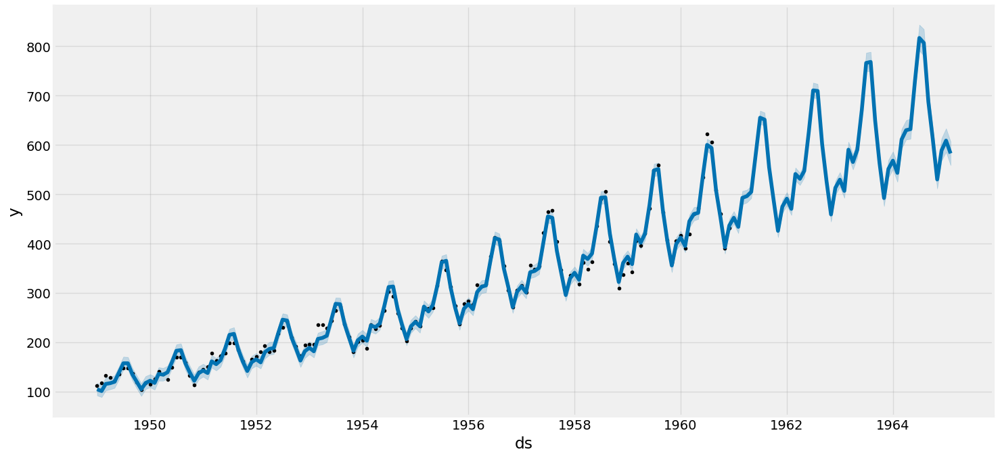

In [17]:
m = Prophet(seasonality_mode='multiplicative', seasonality_prior_scale=1)
m.fit(df)
future = m.make_future_dataframe(50, freq='MS')
forecast = m.predict(future)
m.plot(forecast, figsize=(CFG.img_dim1, CFG.img_dim2))
print()

<AxesSubplot: xlabel='ds'>

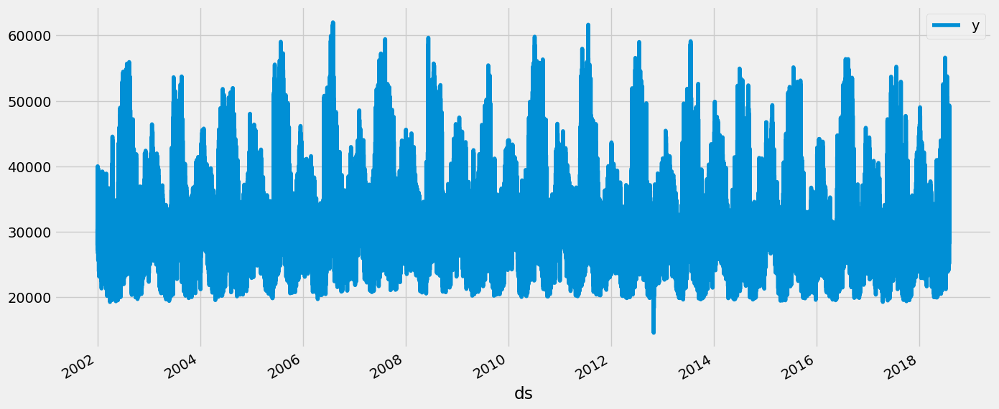

In [18]:
df = pd.read_csv('datasets/pjm_hourly_est.csv')
df['Datetime'] = pd.to_datetime(df['Datetime'])
xdat = df[["Datetime", "PJME"]]
first_valid = np.where(~np.isnan(xdat['PJME']))[0][0]
xdat = xdat.loc[first_valid:].rename(columns={'Datetime':'ds', 'PJME':'y'})
xdat.set_index('ds').plot(figsize=(CFG.img_dim1, CFG.img_dim2))

Initial log joint probability = -200.673
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       70819.1    0.00578355       3410.18           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       70922.4   0.000894652       1344.05      0.3951      0.3951      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       70982.9    0.00564091       579.062           1           1      354   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       71042.3    0.00330371       1748.66      0.9424      0.9424      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       71071.1     0.0504611       6033.88           1           1      572   
    Iter      log prob        ||dx||      ||grad||       alpha  

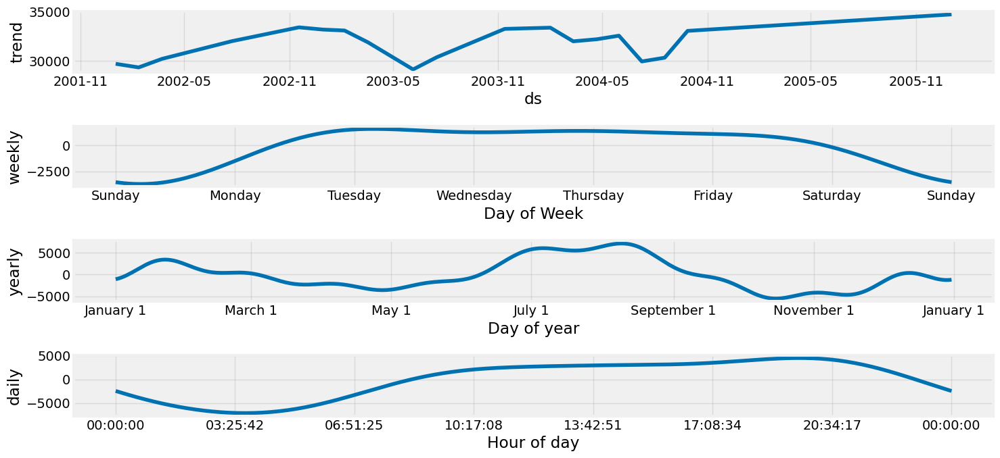

In [19]:
m = Prophet().fit(xdat.iloc[:30000])
future = m.make_future_dataframe(periods = 24, freq= "H")
forecast = m.predict(future)
m.plot_components(forecast, figsize=(CFG.img_dim1, CFG.img_dim2))
print()

In [ ]:
m = Prophet(mcmc_samples=10)
m.fit(xdat.iloc[:30000])
future = m.make_future_dataframe(periods = 24, freq= "H")
forecast = m.predict(future)
m.plot_components(forecast, figsize=(CFG.img_dim1, CFG.img_dim2))
print()

In [20]:
bikerides = pd.read_csv('datasets/bikerides_day.csv', error_bad_lines=False, encoding='unicode_escape', delimiter=',')
bikerides.head(5)
bikerides = bikerides[['Date', 'Volume']].rename(columns={'Date': 'ds', 'Volume': 'y'})

In [21]:
m = Prophet()
m.add_country_holidays(country_name="NO")
m.fit(bikerides)
m.train_holiday_names

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -48.809
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2248.43   4.58608e-05       71.5216      0.4496      0.4496      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132        2248.6   0.000610173       97.0065   6.933e-06       0.001      213  LS failed, Hessian reset 
     193       2248.67   5.65217e-05       76.8478   8.261e-07       0.001      335  LS failed, Hessian reset 
     199       2248.68   3.50685e-05       69.5004           1           1      341   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     242       2248.68   1.70636e-07       63.6132           1           1      398   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


0         Første nyttårsdag
1           Arbeidernes dag
2              Grunnlovsdag
3            Første juledag
4             Andre juledag
5              Skjærtorsdag
6                Langfredag
7           Første påskedag
8            Andre påskedag
9     Kristi himmelfartsdag
10          Første pinsedag
11           Andre pinsedag
dtype: object

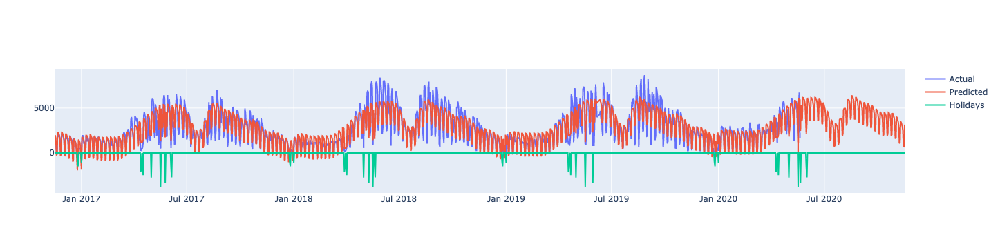

In [22]:
future = m.make_future_dataframe(periods=180, freq='D')
forecast = m.predict(future)

fig = go.Figure()
fig.add_trace(go.Scatter(x=bikerides['ds'], y=bikerides['y'], name='Actual'))
fig.add_trace(go.Scatter(x=forecast['ds'],  y=forecast['yhat'], name='Predicted'))
fig.add_trace(go.Scatter(x=forecast['ds'],  y=forecast['holidays'], name='Holidays'))
fig.show()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -48.809
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2258.44    0.00103936       83.2341           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2259.41   4.03857e-05       61.3965       0.271           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2259.55   4.43714e-05       70.2621       0.851       0.851      361   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     340       2259.66    0.00012325       77.7462   2.007e-06       0.001      445  LS failed, Hessian reset 
     399       2259.73    7.8864e-05       63.9159      0.8452      0.8452      515   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     454       2259.74   2.57976e-06     

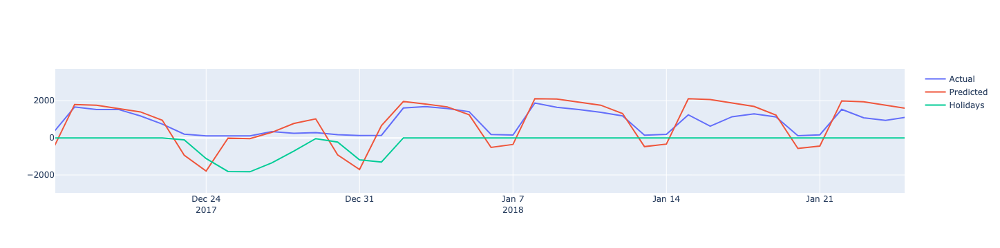

In [39]:
christmas = pd.DataFrame({"holiday":"Christmas",
                         'ds': pd.to_datetime(['2017-12-24','2018-12-24','2019-12-24','2020-12-24']),
                         'lower_window':-1,
                         'upper_window':7})

m = Prophet(holidays=christmas)
m.add_country_holidays(country_name='NO')
m.fit(bikerides)
future = m.make_future_dataframe(periods=0, freq='D')
forecast = m.predict(future)

fig = go.Figure()
fig.add_trace(go.Scatter(x=bikerides['ds'], y=bikerides['y'], name='Actual'))
fig.add_trace(go.Scatter(x=forecast['ds'],  y=forecast['yhat'], name='Predicted'))
fig.add_trace(go.Scatter(x=forecast['ds'],  y=forecast['holidays'], name='Holidays'))
fig.show()

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -16.7301
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       6695.29     0.0131341         940.5           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       6907.25       0.18366       2441.14           1           1      228   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       6996.02      0.037613       268.042           1           1      349   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7067.05     0.0202508       1469.13           1           1      463   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     453       7123.85   6.88539e-05        213.02   2.291e-07       0.001      575  LS failed, Hessian reset 
     499       7137.54    0.00722725    

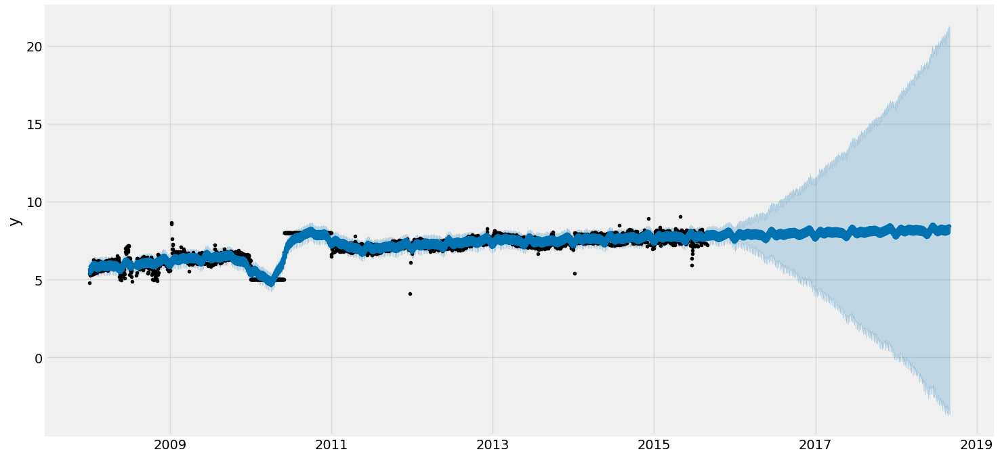

In [28]:
df = pd.read_csv("datasets/example_wp_log_R_outliers1.csv")
df = df.rename(columns={"time":"ds", "log":"y"})
m = Prophet()
m.fit(df)
future = m.make_future_dataframe(periods=1096)
forecast = m.predict(future)
fig = m.plot(forecast, figsize=(CFG.img_dim1, CFG.img_dim2), xlabel='')

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -10.9532
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        7509.2    0.00389595       1073.97      0.4224      0.4224      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7522.08    0.00214979       755.406       0.809       0.809      227   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       7525.13    0.00329765        385.52           1           1      359   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     303       7525.19   7.89142e-05       176.564   8.007e-07       0.001      408  LS failed, Hessian reset 
     383       7525.65    1.8949e-10        119.99   3.453e-08           1      534   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


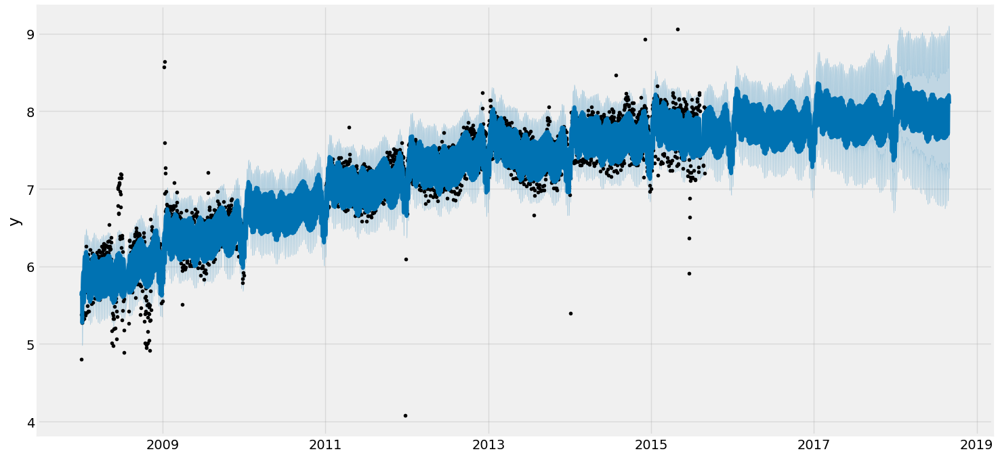

In [29]:
df.loc[(df['ds'] >'2010-01-01') & (df['ds'] < '2011-01-01'), 'y'] = None
m = Prophet()
m.fit(df)
future = m.make_future_dataframe(periods=1096)
forecast = m.predict(future)
fig = m.plot(forecast, figsize=(CFG.img_dim1, CFG.img_dim2), xlabel='')

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -17.2236
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        6573.7    0.00210889       542.048       0.328           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     184       6579.71   0.000111756       151.311   4.487e-07       0.001      258  LS failed, Hessian reset 
     199       6580.67   0.000392647       186.506           1           1      275   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       6581.43   3.23293e-05       68.7256       0.514       0.514      409   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     330        6581.5   2.70025e-05        75.883   4.003e-07       0.001      481  LS failed, Hessian reset 
     364       6581.51   1.87842e-07       64.1251      0.6193      0.6193      527   
Optimization terminat

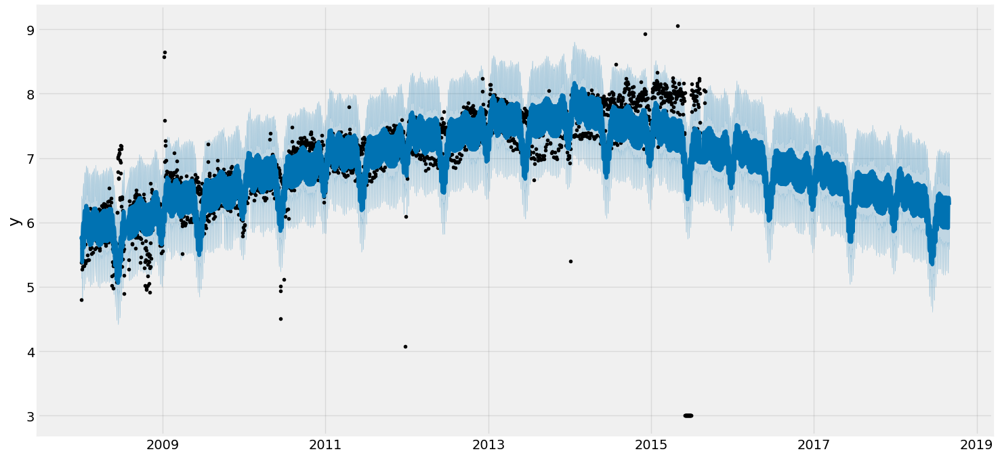

In [30]:
df = pd.read_csv("datasets/example_wp_log_R_outliers2.csv")
df = df.rename(columns={"time":"ds", "log":"y"})
m = Prophet()
m.fit(df)
future = m.make_future_dataframe(periods=1096)
forecast = m.predict(future)
fig = m.plot(forecast, figsize=(CFG.img_dim1, CFG.img_dim2), xlabel='')

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -13.2743
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       8032.49   0.000552315       344.975      0.5213      0.5213      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       8042.77    0.00482795       283.072           1           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       8045.38     0.0032116       327.903           1           1      348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        8047.8   0.000228385       321.395      0.5891      0.5891      471   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       8048.12   0.000185576       78.1847           1           1      596   
    Iter      log prob        ||dx||      ||grad||       alpha  

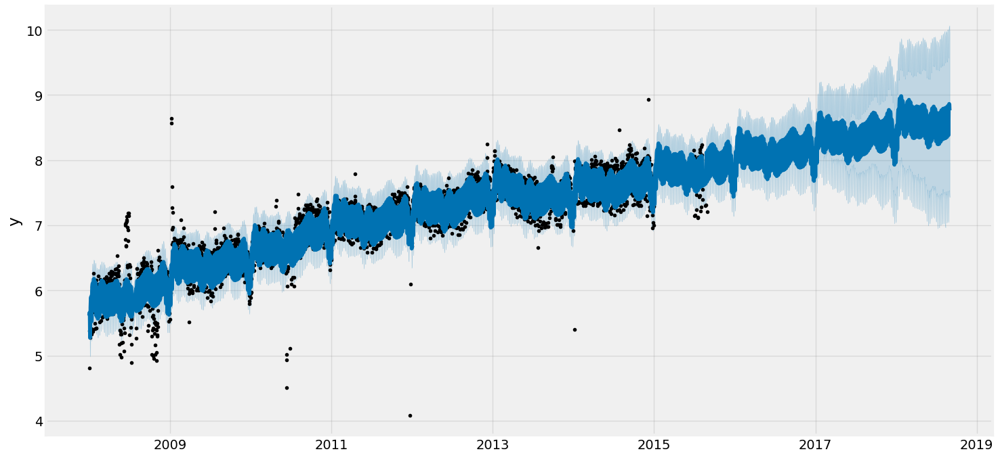

In [31]:
df.loc[(df['ds'] >'2015-01-01') & (df['ds'] < '2015-06-30'), 'y'] = None
m = Prophet()
m.fit(df)
future = m.make_future_dataframe(periods=1096)
forecast = m.predict(future)
fig = m.plot(forecast, figsize=(CFG.img_dim1, CFG.img_dim2), xlabel='')

In [32]:
df_cv = cross_validation(m, initial= '1000 days', period='30 days', horizon='30 days')

INFO:prophet:Making 54 forecasts with cutoffs between 2010-10-24 00:00:00 and 2015-08-01 00:00:00
  0%|                                                    | 0/54 [00:00<?, ?it/s]

Initial log joint probability = -5.60923
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        2845.1     0.0104205       179.444      0.2492           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     186       2849.11   0.000143752       167.842   1.128e-06       0.001      263  LS failed, Hessian reset 
     199       2849.22   0.000708683       115.488      0.4498      0.4498      281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       2849.31   0.000135855       149.534   1.732e-06       0.001      361  LS failed, Hessian reset 
     299       2849.57   0.000388429       93.0417           1           1      447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       2850.04    0.00745504       137.173      0.8683      0.8683      563   
    Iter      log pro

  2%|▊                                           | 1/54 [00:00<00:33,  1.59it/s]

Initial log joint probability = -4.94471
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2939.16    0.00887548       298.743           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2943.79   0.000421549       73.0212           1           1      253   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       2946.97   0.000473529       97.6132      0.8965      0.8965      382   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     366        2948.8   0.000512015       116.059   4.886e-06       0.001      498  LS failed, Hessian reset 
     399          2949   0.000124768       63.8823           1           1      546   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       2949.34   1.86512e-05    

  4%|█▋                                          | 2/54 [00:01<00:30,  1.72it/s]

Initial log joint probability = -5.76185
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3035.55    0.00344127       226.148           1           1      111   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3038.97    0.00939049       323.246      0.3534           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3043.19   0.000154942       100.845      0.2079      0.2079      356   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     319       3043.61   9.45252e-05       133.137   3.552e-07       0.001      414  LS failed, Hessian reset 
     399       3044.55   0.000171334        47.111      0.6592      0.6592      524   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     419       3044.56   0.000117025    

  6%|██▍                                         | 3/54 [00:01<00:30,  1.69it/s]

Initial log joint probability = -5.73113
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3118.31    0.00117913        437.31      0.1994      0.5631      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     192       3127.22   0.000128581       208.188   4.736e-07       0.001      265  LS failed, Hessian reset 
     199       3127.52   0.000276021       503.474      0.2767      0.2767      273   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        3129.9    0.00154557       95.3958      0.4557      0.4557      389   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3132.63     0.0148906       150.514           1           1      516   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     409       3133.44   9.11211e-05    

  7%|███▎                                        | 4/54 [00:02<00:28,  1.74it/s]

Initial log joint probability = -5.11606
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3215.31    0.00558969        403.97           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3220.12    0.00401579       393.919      0.5141      0.5141      249   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3224.68   0.000244509       63.8052      0.9857      0.9857      380   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     372       3225.41   5.94026e-05       101.648   5.909e-07       0.001      505  LS failed, Hessian reset 
     399       3225.42   5.06053e-07       69.8953      0.6979      0.6979      542   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     404       3225.42   3.36324e-07    

  9%|████                                        | 5/54 [00:02<00:26,  1.85it/s]

Initial log joint probability = -5.13027
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3312.75      0.010844         557.1           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3322.18   0.000672235       222.931      0.8116      0.8116      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     267       3323.25   8.89052e-05       146.646   8.724e-07       0.001      370  LS failed, Hessian reset 
     299       3323.56   0.000898662       149.701           1           1      405   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     333       3323.69   0.000238412       82.4017    3.47e-06       0.001      484  LS failed, Hessian reset 
     399       3324.02   0.000148556       84.6347       2.081      0.5575      565   
    Iter      log pro

 11%|████▉                                       | 6/54 [00:03<00:27,  1.75it/s]

Initial log joint probability = -6.04475
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3414.14    0.00944076       523.416           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3419.55    0.00202406       126.545      0.8239      0.8239      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3423.65    0.00478218        210.77      0.3265           1      355   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     347        3425.7   7.67458e-05       151.827   5.309e-07       0.001      447  LS failed, Hessian reset 
     399       3426.06   0.000212237       80.9803           1           1      511   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     426       3426.12   0.000164131    

 13%|█████▋                                      | 7/54 [00:03<00:26,  1.77it/s]

Initial log joint probability = -7.37862
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3516.13    0.00351792       387.298      0.5751      0.5751      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3524.35   0.000881398       300.804           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     257       3525.65    9.4677e-05       131.123   2.526e-07       0.001      347  LS failed, Hessian reset 
     299       3526.17    0.00424138        129.54           1           1      409   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3527.92   0.000114271       84.6625           1           1      541   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       3529.28   0.000226468    

 15%|██████▌                                     | 8/54 [00:04<00:27,  1.66it/s]

Initial log joint probability = -5.5553
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3617.73    0.00287787       261.464           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3625.95   0.000710175       95.1781           1           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        3630.3   0.000449856       80.8349           1           1      356   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3633.09    0.00151859       185.946           1           1      481   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       3633.71    1.2932e-05       76.6138      0.3719           1      598   
    Iter      log prob        ||dx||      ||grad||       alpha   

 17%|███████▎                                    | 9/54 [00:05<00:28,  1.61it/s]

Initial log joint probability = -6.27347
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3717.24    0.00168564       208.782        0.57        0.57      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3725.32    0.00781643       329.822           1           1      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3729.72    0.00110419       438.017      0.4848      0.4848      368   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       3730.65   6.05275e-05       91.9728           1           1      492   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     414       3730.83   4.40717e-05       111.925   3.211e-07       0.001      557  LS failed, Hessian reset 
     482       3731.12   0.000116418    

 19%|███████▉                                   | 10/54 [00:06<00:28,  1.55it/s]

Initial log joint probability = -7.80024
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       3819.19     0.0217675       869.714           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     175       3826.13   6.36171e-05       146.927   3.342e-07       0.001      240  LS failed, Hessian reset 
     199       3827.47   0.000199355        129.44      0.5473      0.5473      273   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       3833.99    0.00137048       357.067      0.8769      0.8769      390   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     388       3835.53   0.000149406        245.55   9.429e-07       0.001      546  LS failed, Hessian reset 
     399       3835.66   0.000571402       217.629           1           1      557   
    Iter      log pro

 20%|████████▊                                  | 11/54 [00:06<00:28,  1.50it/s]

e-05       60.8297      0.7373      0.7373     1253   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     982       3839.16   2.87879e-07       74.0899   4.164e-09       0.001     1402  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -6.29487
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        3914.5   0.000261515       157.066           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       3925.33    0.00353515       651.699      0.2879           1      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     289        3928.4    9.3864e-05       185.338   7.507e-07       0.001      388  LS failed, Hessian reset 
     299       3928.53   0.0001950

 22%|█████████▌                                 | 12/54 [00:07<00:26,  1.58it/s]

Initial log joint probability = -6.09902


 24%|██████████▎                                | 13/54 [00:08<00:27,  1.50it/s]

    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4014.34     0.0014001       206.131      0.6653      0.6653      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     186       4026.51    4.7628e-05       120.464    3.01e-07       0.001      261  LS failed, Hessian reset 
     199        4027.4     0.0113469       571.731           1           1      278   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4030.95    0.00145891       182.463           1           1      406   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     330       4031.96   0.000107393         259.5   2.867e-07       0.001      494  LS failed, Hessian reset 
     399        4033.3   0.000194288        111.62           1           1      583   
    Iter      log prob        ||dx||      ||grad||       alpha

 26%|███████████▏                               | 14/54 [00:08<00:29,  1.36it/s]

Initial log joint probability = -8.53685
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4203.85     0.0166988       1381.39           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        4216.3    0.00531979       95.6861           1           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4220.21   0.000719583       200.128           1           1      357   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4222.17   0.000332861       112.051      0.9837      0.9837      492   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     413       4222.49   0.000112046       244.844   2.128e-07       0.001      542  LS failed, Hessian reset 
     499        4223.2   0.000108996    

 28%|███████████▉                               | 15/54 [00:09<00:28,  1.38it/s]

Initial log joint probability = -6.3892
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4230.35    0.00149981       402.123     0.08842      0.9271      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166       4233.62   0.000240094       163.357   3.514e-06       0.001      243  LS failed, Hessian reset 
     199       4234.26    0.00390914       296.626       0.791       0.791      280   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     248       4234.85   3.06883e-05       76.1856   3.191e-07       0.001      385  LS failed, Hessian reset 
     299       4237.28   0.000952231       237.825           1           1      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4239.98    0.00234103        102.45           1           1      580   
    Iter      log prob

 30%|████████████▋                              | 16/54 [00:10<00:28,  1.32it/s]

Initial log joint probability = -6.22759
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4330.49   0.000431418       104.364           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     196       4336.25   5.03451e-05        122.76   4.999e-07       0.001      274  LS failed, Hessian reset 
     199        4336.3   0.000612884       172.295           1           1      277   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     247       4337.19   0.000135404       104.998   1.158e-06       0.001      372  LS failed, Hessian reset 
     267       4337.28   4.83796e-05       108.853   2.549e-07       0.001      446  LS failed, Hessian reset 
     299       4337.66     0.0249059       681.532           1           1      487   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

 31%|█████████████▌                             | 17/54 [00:11<00:26,  1.38it/s]

Initial log joint probability = -8.81133
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4430.86   0.000819666        197.17       0.433           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4436.22   0.000203175       138.634           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4439.79   0.000130898       90.3445      0.2614      0.2614      360   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     303       4439.82   3.45747e-05         85.83   2.599e-07       0.001      410  LS failed, Hessian reset 
     399       4441.26    0.00030072       258.386      0.6859      0.6859      529   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     448       4441.76   0.000216165    

 33%|██████████████▎                            | 18/54 [00:11<00:27,  1.32it/s]

Initial log joint probability = -7.17608
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4534.18    0.00440594       111.302           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     186       4537.03   0.000230283       182.384   2.259e-06       0.001      264  LS failed, Hessian reset 
     199       4537.17   0.000327108       58.4216           1           1      278   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     282        4540.2   8.97404e-05       201.343    6.09e-07       0.001      419  LS failed, Hessian reset 
     299       4541.06   0.000450005       119.376           1           1      437   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4542.18   0.000491355        239.81      0.4929      0.4929      567   
    Iter      log pro

 35%|███████████████▏                           | 19/54 [00:12<00:25,  1.35it/s]

Initial log joint probability = -7.15334
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4634.73   0.000529536       151.256      0.4226      0.4226      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4639.09     0.0119687       115.069           1           1      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4642.31   0.000550202       134.759           1           1      371   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        4645.8   0.000528198       195.865      0.2183      0.2183      493   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     494       4647.58   0.000237639       278.114   1.233e-06       0.001      653  LS failed, Hessian reset 
     499        4647.6   0.000205303    

 37%|███████████████▉                           | 20/54 [00:13<00:23,  1.42it/s]

Initial log joint probability = -6.5173
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4730.85   0.000686326       226.474       0.484       0.484      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4738.98    0.00342084       403.454      0.1246           1      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4743.22   0.000134706       169.517      0.7605      0.7605      372   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4745.88   0.000285094       185.339      0.8351      0.8351      493   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       4746.75   1.09466e-05       65.9266           1           1      626   
    Iter      log prob        ||dx||      ||grad||       alpha   

 39%|████████████████▋                          | 21/54 [00:14<00:24,  1.37it/s]

Initial log joint probability = -10.2772
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       4833.14    0.00103928       401.511      0.5797      0.5797      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       4838.19   0.000727225       132.888           1           1      252   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4841.47     0.0173292       880.783      0.2771           1      370   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     303       4842.14   0.000118486       330.031    2.59e-07       0.001      413  LS failed, Hessian reset 
     399       4846.35   0.000393039       194.368      0.4055      0.9209      537   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       4850.46   0.000878128    

 41%|█████████████████▌                         | 22/54 [00:14<00:24,  1.29it/s]

Initial log joint probability = -7.60847
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        4935.1   0.000429965       376.339      0.8593      0.8593      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        4941.8   0.000405628       636.773      0.7987      0.7987      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       4945.07   0.000118045       183.864      0.6724      0.6724      346   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       4951.88    0.00135453       534.399      0.2237           1      461   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       4954.54   9.22696e-05       199.037      0.2537      0.2537      589   
    Iter      log prob        ||dx||      ||grad||       alpha  

 43%|██████████████████▎                        | 23/54 [00:15<00:25,  1.24it/s]

Initial log joint probability = -7.00081
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       5040.67    0.00444003       452.842           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       5052.07    0.00470053       325.082           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       5059.24     0.0105196        711.19       6.546      0.6546      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       5062.23   0.000546693        186.08           1           1      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     442       5062.56   3.28715e-05       123.154   2.479e-07       0.001      561  LS failed, Hessian reset 
     493       5062.95    3.6711e-05    

 44%|███████████████████                        | 24/54 [00:16<00:24,  1.23it/s]

Initial log joint probability = -9.43964
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

Error evaluating model log probability: Non-finite gradient.

      99        5139.6    0.00301506        389.97      0.7953      0.7953      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       5151.36    0.00288634       147.535           1           1      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       5158.37   0.000332002       177.331      0.2569           1      361   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       5160.58    0.00483139       328.055           1           1      493   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # e

 46%|███████████████████▉                       | 25/54 [00:17<00:23,  1.23it/s]

Initial log joint probability = -7.46311
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       5236.24    0.00216255       232.804      0.9204      0.9204      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       5237.78   0.000227895       187.919   1.448e-06       0.001      170  LS failed, Hessian reset 
     199          5242     0.0193888       152.392      0.6283           1      270   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       5248.54   0.000152497       316.243     0.03933      0.8498      391   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       5250.53   0.000946447       133.674      0.6681      0.6681      507   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     441       5252.48   9.36982e-05    

 48%|████████████████████▋                      | 26/54 [00:18<00:23,  1.19it/s]

Initial log joint probability = -7.41824
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       5337.62    0.00202762       166.862      0.3167      0.3167      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       5343.52    0.00121423       241.468           1           1      257   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       5348.09     0.0172629       902.135           1           1      371   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       5352.02     0.0037007       368.121           1           1      495   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     457       5352.61   3.81736e-05       113.854   6.437e-07       0.001      628  LS failed, Hessian reset 
     499       5352.91   0.000123777    

 50%|█████████████████████▌                     | 27/54 [00:19<00:22,  1.18it/s]

Initial log joint probability = -7.3203
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       5430.67   0.000289453       82.6038           1           1      113   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       5436.16    0.00016647       196.104       0.546       0.546      226   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     295       5438.91   0.000105339       308.594   5.094e-07       0.001      383  LS failed, Hessian reset 
     299       5439.04    0.00111139       332.748           1           1      387   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       5441.94   0.000165768       100.549      0.9221      0.9221      509   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       5442.86    0.00727337     

 52%|██████████████████████▎                    | 28/54 [00:20<00:21,  1.20it/s]

Initial log joint probability = -9.63505
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Exception: normal_lpdf: Scale parameter is 0, but must be > 0!  (in 'unknown file name' at line 136)

Error evaluating model log probability: Non-finite gradient.
Error evaluating model log probability: Non-finite gradient.

      99       5533.72    0.00682236       606.891           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     148        5537.2   5.82724e-05       186.078   1.794e-07       0.001      229  LS failed, Hessian reset 
     199       5539.14    0.00307031       327.716           1           1      296   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     207        5539.4   9.94707e-05       249.859   6.856e-07       0.001      356  LS failed, Hessian reset 
     299       5540.94    0.00166556       110.265           1

 54%|███████████████████████                    | 29/54 [00:20<00:20,  1.23it/s]

Initial log joint probability = -7.36519
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       5639.58    0.00118302       111.663           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       5642.07   0.000172302       247.267    2.23e-06       0.001      225  LS failed, Hessian reset 
     199       5642.82     0.0120429       329.907           1           1      274   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       5643.18   3.47602e-05       127.204   2.542e-07       0.001      348  LS failed, Hessian reset 
     299       5644.84     0.0128336       263.903      0.7349      0.7349      455   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       5645.76   0.000401407       42.5474           1           1      583   
    Iter      log pro

 56%|███████████████████████▉                   | 30/54 [00:21<00:19,  1.22it/s]

Initial log joint probability = -8.14268
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       5744.45    0.00792053       438.924      0.7894     0.07894      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       5747.85   0.000570606       322.196      0.6193      0.6193      249   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       5751.03    0.00120052       242.948           1           1      366   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       5756.96    0.00067316       307.472      0.6352      0.6352      493   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       5757.63   0.000329271       80.7961           1           1      629   
    Iter      log prob        ||dx||      ||grad||       alpha  

 57%|████████████████████████▋                  | 31/54 [00:22<00:19,  1.18it/s]

Initial log joint probability = -12.7108
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       5839.55    0.00226995       699.526      0.7641      0.7641      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       5844.31    0.00174303       344.789      0.5653           1      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       5848.69   0.000759895       388.895           1           1      364   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     339       5849.55   6.89841e-05       275.789   2.372e-07       0.001      460  LS failed, Hessian reset 
     399       5851.05   0.000550269       104.058      0.3491           1      546   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     430       5851.24   2.75735e-05    

 59%|█████████████████████████▍                 | 32/54 [00:23<00:19,  1.12it/s]

Initial log joint probability = -9.11674
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      99       5944.41    0.00717875       555.067           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       5948.55    0.00914595       330.377      0.2791           1      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     225       5950.88   9.65261e-05       240.643   6.724e-07       0.001      316  LS failed, Hessian reset 
     299       5952.42     0.0013276       123.555           1           1      414   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       5956.06    0.00132015       100.252       0.741       0.741      538   
    Iter      log prob        ||dx||      ||grad||       alpha      al

 61%|██████████████████████████▎                | 33/54 [00:24<00:19,  1.09it/s]

Initial log joint probability = -9.44649
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.
Error evaluating model log probability: Non-finite gradient.

      99       6045.41   0.000108371       210.015      0.2703      0.2703      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       6049.68    0.00142913       290.301           1           1      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       6051.77   0.000583474       202.825      0.9673      0.9673      371   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       6060.21     0.0104194       964.408      0.4836           1      486   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       6065.03   0.0

 63%|███████████████████████████                | 34/54 [00:25<00:17,  1.13it/s]

Initial log joint probability = -10.8049
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       6128.94    0.00579821       339.716           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       6133.96   0.000415601       153.997           1           1      250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        6138.9     0.0107087       890.127           1           1      371   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       6145.17   0.000414327       266.532       1.356      0.1356      490   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     446        6145.6   3.58099e-05       133.658   1.419e-07       0.001      592  LS failed, Hessian reset 
     499       6145.97    0.00139158    

 65%|███████████████████████████▊               | 35/54 [00:26<00:16,  1.13it/s]

Initial log joint probability = -15.3827
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        6217.9    0.00286941        611.49           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        6227.6    0.00151819       183.977           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       6230.41   2.44058e-05       109.797   2.135e-07       0.001      323  LS failed, Hessian reset 
     257       6231.57   0.000297478       297.792   3.529e-06       0.001      387  LS failed, Hessian reset 
     299       6232.17    0.00978252       680.184      0.9375      0.9375      440   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       6234.26   0.000345266       245.531      0.6372      0.6372      571   
    Iter      log pro

 67%|████████████████████████████▋              | 36/54 [00:27<00:18,  1.02s/it]

Initial log joint probability = -10.1778
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       6323.01     0.0019663        292.32           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       6333.17    0.00213773       284.713           1           1      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       6336.41    0.00555036       476.915           1           1      370   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        6340.9     0.0224541        725.97           1           1      491   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       6343.96     0.0015225       156.489           1           1      615   
    Iter      log prob        ||dx||      ||grad||       alpha  

 69%|█████████████████████████████▍             | 37/54 [00:28<00:17,  1.01s/it]

Initial log joint probability = -11.3859
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       6430.43    0.00344175       251.755      0.7996      0.7996      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       6432.93   9.00114e-05       266.825   7.123e-07       0.001      187  LS failed, Hessian reset 
     199       6440.83    0.00014096       249.867      0.3963      0.3963      277   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     250       6442.68   4.72548e-05       200.116   1.722e-07       0.001      375  LS failed, Hessian reset 
     299       6443.29   0.000149952       87.5151      0.6365      0.6365      430   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       6446.18    0.00120907       88.5849      0.1677           1      550   
    Iter      log pro

 70%|██████████████████████████████▎            | 38/54 [00:29<00:16,  1.00s/it]

Initial log joint probability = -13.2306
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       6542.47    0.00953589       538.512      0.7006      0.7006      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       6553.01    0.00409882       278.762           1           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       6557.07    0.00169393       227.009           1           1      369   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     358       6557.58   4.07327e-05       144.965    5.24e-07       0.001      487  LS failed, Hessian reset 
     399       6557.74   6.66629e-05       61.7674           1           1      544   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     414        6558.2   6.28113e-05    

 72%|███████████████████████████████            | 39/54 [00:30<00:15,  1.05s/it]

Initial log joint probability = -51.4965
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       6612.47    0.00514366        707.21           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       6627.13    0.00208595       340.662           1           1      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       6630.13    0.00134195       157.985           1           1      357   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       6632.09      0.026895       654.475           1           1      485   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       6634.23   7.40386e-05       92.1691      0.3374           1      617   
    Iter      log prob        ||dx||      ||grad||       alpha  

 74%|███████████████████████████████▊           | 40/54 [00:31<00:14,  1.01s/it]

  6634.49   4.23918e-05       196.591   1.706e-07       0.001      737  LS failed, Hessian reset 
     597       6634.61   1.69937e-05       76.6076   1.344e-07       0.001      828  LS failed, Hessian reset 
     599       6634.61   3.82617e-05       65.6507           1           1      831   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     697       6635.35   4.45459e-05       92.8272   1.032e-07       0.001      981  LS failed, Hessian reset 
     699       6635.37    0.00025703       125.342           1           1      984   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       6635.78   4.13171e-06       67.6354      0.5268      0.5268     1109   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     826       6635.78   4.49615e-05        79.035   5.307e-07       0.001     1193  LS failed, Hessian reset 
     849       6635.78   3.80945

 76%|████████████████████████████████▋          | 41/54 [00:32<00:13,  1.01s/it]

Initial log joint probability = -10.5583
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.
Error evaluating model log probability: Non-finite gradient.

      99       6824.32    0.00628299       466.591           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       6831.55   0.000202032       71.1473      0.7543      0.7543      251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       6837.01   0.000160662       90.0268           1           1      376   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     314       6837.34   4.76722e-05       145.067   6.524e-07       0.001      465  LS failed, Hessian reset 
     371       6837.75   9.97821e-05       193.707   6.528e-07       0.001      576  LS failed, 

 78%|█████████████████████████████████▍         | 42/54 [00:33<00:13,  1.09s/it]

Initial log joint probability = -14.5872
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       6927.25    0.00309501        826.04      0.9952      0.9952      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       6932.44    0.00118877       258.647      0.4416           1      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       6934.64    0.00349106       310.593           1           1      366   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     340       6935.37   2.39579e-05       74.7294   1.042e-07       0.001      457  LS failed, Hessian reset 
     399       6936.27   0.000118574       157.844      0.9307      0.9307      528   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     455       6936.84   0.000130176    

 80%|██████████████████████████████████▏        | 43/54 [00:34<00:11,  1.04s/it]

Initial log joint probability = -10.0863
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      99       7024.52    0.00878114       503.178           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7030.33   0.000314987        83.049      0.3584     0.03584      254   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     222       7030.71   1.49853e-05       77.3568   1.566e-07       0.001      332  LS failed, Hessian reset 
     299       7031.74   0.000623026       66.9801           1           1      435   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     311       7031.86   5.13706e-05       216.712   2.722e-07       0.001      488  LS failed, Hessian reset 
     399       7032.63   0.000182775       117

 81%|███████████████████████████████████        | 44/54 [00:35<00:09,  1.01it/s]

Initial log joint probability = -10.8209
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7112.71   0.000973274       184.293           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7120.39    0.00441157       229.432           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       7122.87    0.00256501       186.627           1           1      349   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7124.23    0.00183241       182.323           1           1      468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       7126.46   0.000103017       77.8215       0.624       0.624      584   
    Iter      log prob        ||dx||      ||grad||       alpha  

 85%|████████████████████████████████████▋      | 46/54 [00:37<00:07,  1.08it/s]

Initial log joint probability = -18.5219
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7217.28   0.000446857       623.378      0.4621      0.4621      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7224.06     0.0211459       1722.62      0.4322           1      251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       7224.39   6.43964e-05       211.446   8.749e-07       0.001      300  LS failed, Hessian reset 
     299       7226.66   0.000946153       1177.29      0.3471      0.3471      415   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7228.58   0.000939905       151.618      0.2885      0.2885      537   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     400       7228.58   2.13607e-05    

 87%|█████████████████████████████████████▍     | 47/54 [00:38<00:06,  1.06it/s]

e-06       58.6018   1.094e-07       0.001     1266  LS failed, Hessian reset 
     877       7319.74   7.36857e-07       37.0356      0.3058      0.9688     1270   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -10.5246
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7402.24    0.00073086       224.939           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7411.47     0.0108693       164.808      0.8946      0.8946      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       7419.26   0.000848774       236.999       0.547       0.547      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7420.59    0.00178401       108.442        

 89%|██████████████████████████████████████▏    | 48/54 [00:39<00:05,  1.00it/s]

dx||      ||grad||       alpha      alpha0  # evals  Notes 
     945       7425.77    6.9873e-05       61.1214   8.113e-07       0.001     1377  LS failed, Hessian reset 
     980       7425.77    4.0592e-06         54.83   6.802e-08       0.001     1473  LS failed, Hessian reset 
     999       7425.77   5.61259e-07       48.6559      0.3477      0.3477     1501   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1003       7425.77   1.70576e-06       56.2421   3.413e-08       0.001     1540  LS failed, Hessian reset 
    1006       7425.77   3.25021e-07        37.202      0.2333           1     1544   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -12.7017
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7508.71    0.00670311       889.892           1           1      124   
    Iter      l

 91%|███████████████████████████████████████    | 49/54 [00:40<00:05,  1.07s/it]

Initial log joint probability = -18.429
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        7617.4   0.000684554         442.2      0.4118      0.8592      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7630.48    0.00073094       190.258           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     289       7632.84   2.65681e-05       144.781   1.468e-07       0.001      400  LS failed, Hessian reset 
     299       7632.96   0.000177896       56.0047      0.9818      0.9818      410   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399          7634    0.00010494       145.203       3.293           1      546   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     427        7634.1   2.88578e-05     

 93%|███████████████████████████████████████▊   | 50/54 [00:41<00:04,  1.08s/it]

Initial log joint probability = -11.3439
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7724.48    0.00263687       579.746           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       7728.86   4.73353e-05       274.958   1.735e-07       0.001      205  LS failed, Hessian reset 
     199       7737.08    0.00608984       325.161           1           1      288   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       7740.84   0.000377504       125.135           1           1      417   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     358       7741.63   3.88847e-05       184.822   9.981e-08       0.001      531  LS failed, Hessian reset 
     399       7742.14   0.000555005       261.592           1           1      588   
    Iter      log pro

 94%|████████████████████████████████████████▌  | 51/54 [00:43<00:03,  1.13s/it]

Initial log joint probability = -22.8897
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7882.69     0.0183148       3392.59           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     189       7895.85   2.65953e-05       163.933   1.571e-07       0.001      282  LS failed, Hessian reset 
     199       7896.05    0.00111497       410.387           1           1      294   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       7898.82   0.000101424       62.0135           1           1      419   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7902.24    0.00140908       313.819      0.2482      0.4092      547   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     487       7903.48   0.000219304    

 96%|█████████████████████████████████████████▍ | 52/54 [00:44<00:02,  1.32s/it]

.001     2415  LS failed, Hessian reset 
    1485        7909.4   4.42068e-05       110.144   5.673e-07       0.001     2527  LS failed, Hessian reset 
    1499       7909.41   2.57087e-06       65.6686           1           1     2546   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1514       7909.41   2.46375e-07       60.3431     0.02978           1     2565   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -12.5206
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        7892.2    0.00196499        559.37           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7901.13    0.00324937        1398.2      0.4521           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  #

 98%|██████████████████████████████████████████▏| 53/54 [00:45<00:01,  1.23s/it]

41   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       7911.66   0.000846495       182.933           1           1      769   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       7912.45   7.92668e-05       59.6149           1           1      899   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     783       7913.35   3.44195e-05       190.136   1.486e-07       0.001     1043  LS failed, Hessian reset 
     799       7913.59   0.000162046       75.3223           1           1     1063   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     850       7913.92   1.36036e-05       77.7365    1.15e-07       0.001     1164  LS failed, Hessian reset 
     875       7913.93   1.30732e-06       62.5745    2.21e-08       0.001     1251  LS failed, Hessian reset 
     877       7913.93   8.99781

100%|███████████████████████████████████████████| 54/54 [00:47<00:00,  1.14it/s]

 log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       8008.17   0.000135171       79.5259       0.643       0.643     1318   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       8008.38   0.000808496        171.65           1           1     1454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       8008.67    0.00121246       104.943           1           1     1580   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1177       8009.78   7.89162e-05       296.041   3.891e-07       0.001     1710  LS failed, Hessian reset 
    1199       8009.92   0.000297419       110.299      0.7042      0.7042     1738   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1261       8010.29   2.58521e-05       144.556   1.517e-07       0.001     1853  LS failed

In [33]:
df_cv

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2010-10-25,6.917671,6.566907,7.257759,7.199678,2010-10-24
1,2010-10-26,6.987494,6.647006,7.349726,7.375256,2010-10-24
2,2010-10-27,7.010821,6.649114,7.384574,7.370860,2010-10-24
3,2010-10-28,7.006674,6.675860,7.375612,7.407318,2010-10-24
4,2010-10-29,6.921245,6.561030,7.279126,7.237778,2010-10-24
...,...,...,...,...,...,...
1564,2015-08-23,7.679861,7.365348,7.941429,7.307873,2015-08-01
1565,2015-08-26,8.156088,7.862743,8.448941,8.058327,2015-08-01
1566,2015-08-28,8.057192,7.768015,8.331500,7.859413,2015-08-01
1567,2015-08-29,7.709511,7.433903,8.004815,7.202661,2015-08-01


In [34]:
df_p = performance_metrics(df_cv)
df_p

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,3 days,0.036963,0.192258,0.149026,0.020210,0.015430,0.020149,0.886095
1,4 days,0.048698,0.220676,0.159354,0.021343,0.017461,0.021409,0.887518
2,5 days,0.103962,0.322432,0.175978,0.025636,0.017778,0.024491,0.911708
3,6 days,0.102769,0.320576,0.175697,0.025546,0.018249,0.024413,0.892477
4,7 days,0.092130,0.303528,0.172499,0.025253,0.019177,0.024081,0.897920
5,8 days,0.044021,0.209811,0.162781,0.022055,0.018081,0.022026,0.866248
6,9 days,0.044624,0.211244,0.166358,0.022621,0.018524,0.022565,0.872411
7,10 days,0.041962,0.204846,0.160546,0.021860,0.018735,0.021782,0.879294
8,11 days,0.032730,0.180914,0.150889,0.020423,0.020139,0.020412,0.910256
9,12 days,0.030382,0.174304,0.146076,0.019781,0.018952,0.019772,0.929487


SuperStore Dataset

<AxesSubplot: >

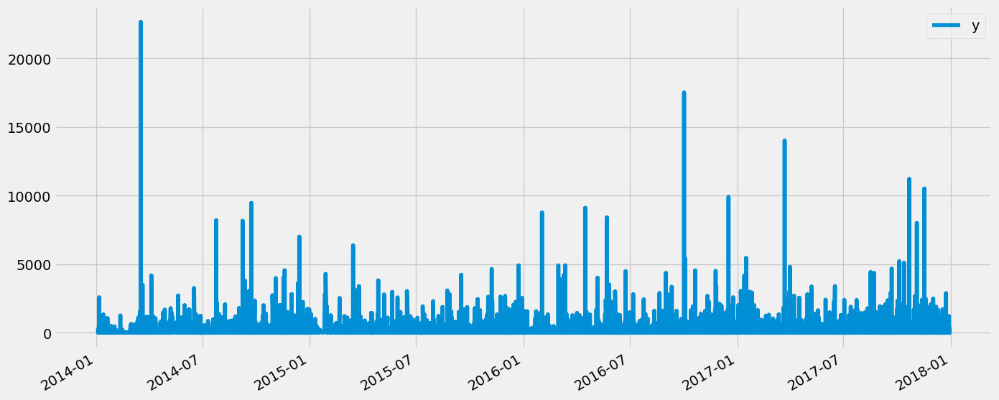

In [44]:
df = pd.read_excel('datasets/Sample - Superstore.xls')
df = df[["Order Date", "Sales"]].rename(columns={'Order Date': "ds", "Sales": 'y'})
df = df.sort_values(by="ds")
df.set_index('ds').plot(figsize=(CFG.img_dim1, CFG.img_dim2), xlabel='')

In [46]:
min(df['ds']), max(df['ds'])

(Timestamp('2014-01-03 00:00:00'), Timestamp('2017-12-30 00:00:00'))

In [47]:
df_train = df.loc[df['ds'] < '2017-10-01']
df_test  = df.loc[df['ds'] >= '2017-10-01']
print(df_train.shape, df_test.shape)

(8775, 2) (1219, 2)


In [49]:
param_grid = {
    'changepoint_prior_scale': [0.001, 0.1],
    'seasonality_mode': ['additive', 'multiplicative']
}

all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
rmses = []
all_params

[{'changepoint_prior_scale': 0.001, 'seasonality_mode': 'additive'},
 {'changepoint_prior_scale': 0.001, 'seasonality_mode': 'multiplicative'},
 {'changepoint_prior_scale': 0.1, 'seasonality_mode': 'additive'},
 {'changepoint_prior_scale': 0.1, 'seasonality_mode': 'multiplicative'}]

In [52]:
for params in all_params:
    m = Prophet(**params)
    m.fit(df)
    df_cv = cross_validation(m, initial='100 days', period='30 days', horizon='30 days', parallel="processes")
    df_p  = performance_metrics(df_cv, rolling_window=1)
    rmses.append(df_p['rmse'].values[0])

tuning_results = pd.DataFrame(all_params)
tuning_results['rmse'] = rmses
print(tuning_results)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -6.23711
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30918.5   5.74653e-08       4527.69           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       30918.5   3.20561e-08       5199.83           1           1      140   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Making 45 forecasts with cutoffs between 2014-04-20 00:00:00 and 2017-11-30 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x302529f40>


Initial log joint probability = -2.58593
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      68       1247.14    7.7484e-09       5111.35      0.4509      0.4509       91   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -3.0977
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       5314.66   9.22137e-09       4999.38      0.3942      0.3942      117   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -2.94839
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      45       3719.34    7.9861e-06       5007.09   1.587e-09       0.001      104  LS failed, Hessian reset 
      70       3719.38    8.1997e-09       5045.85      0.3143      0.3143      137   
Optimization termina

/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fu

Initial log joint probability = -6.23711
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      64         30907   1.96606e-05       5017.81   3.939e-09       0.001      137  LS failed, Hessian reset 
      87       30907.1   1.75089e-08       4976.74      0.5076      0.5076      167   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


rning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mananshah/mi

Initial log joint probability = -2.61108
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      79       1605.98   5.91897e-09       4937.76      0.2589      0.2589      113   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Initial log joint probability = -3.21331
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -2.63943
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       5908.67    4.2237e-08        4971.4      0.1867           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      54       2035.32    6.8251e-05       4887.55   1.364e-08       0.001      123  LS failed, Hessian reset 
     102       5908.67   4.99165e-09       4509.01      0.1876           1      136   
Optimization terminated normally

/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fu

Initial log joint probability = -6.23711
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         30919   2.05919e-05       102.653           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       30919.1   0.000210038       95.6891      0.1807           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     268       30919.2   2.37893e-06       29.6241      0.6771      0.6771      319   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


niforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use p

Initial log joint probability = -2.55175
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       922.928   3.80183e-07       50.6996      0.3449      0.3449      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       922.928   7.81047e-08        48.565      0.3292           1      137   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -2.58593
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1249.04   1.40606e-05       49.6595      0.2759           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       1249.04   1.04898e-07       48.3794      0.6624      0.6624      157   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below 

/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fu

Initial log joint probability = -6.23711
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       30916.5   0.000396253       160.251           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       30918.8   0.000487113       164.643           1           1      256   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       30919.2   0.000177775       361.476       0.122           1      398   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       30919.4   0.000124632       57.0518      0.1898           1      531   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     409       30919.4   1.48377e-05       30.0487           1           1      546   
Optimization terminated normally: 
  Convergence detected: relat

andas.concat instead.
  components = components.append(new_comp)
/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.ap

Initial log joint probability = -2.58593
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1248.57    0.00023747       42.1875      0.2354           1      143   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1250.96    0.00180645       40.9948           1           1      262   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -2.61108
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1251.28   0.000339078       45.5866           1           1      397   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1612.9    0.00701471       168.041      0.3483      0.9283      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     392       125

/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/mananshah/miniforge3/envs/ts_env/lib/python3.8/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fu

ValueError: Length of values (8) does not match length of index (4)

In [53]:
best_params = all_params[np.argmin(rmses)]
print(best_params)

{'changepoint_prior_scale': 0.001, 'seasonality_mode': 'multiplicative'}


In [55]:
rmses

[580.9819475897592,
 578.5545815823549,
 581.964820884326,
 582.0177872651162,
 594.2212843487332,
 589.3877386529437,
 716.1555958218862,
 594.8699473449129]

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -5.67633
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       27177.2   3.94836e-08       4823.06      0.1418      0.6268      126   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


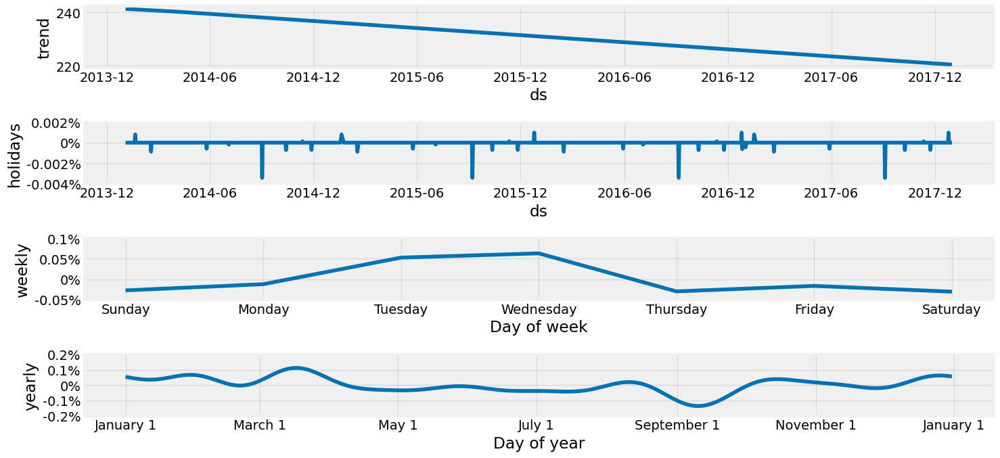

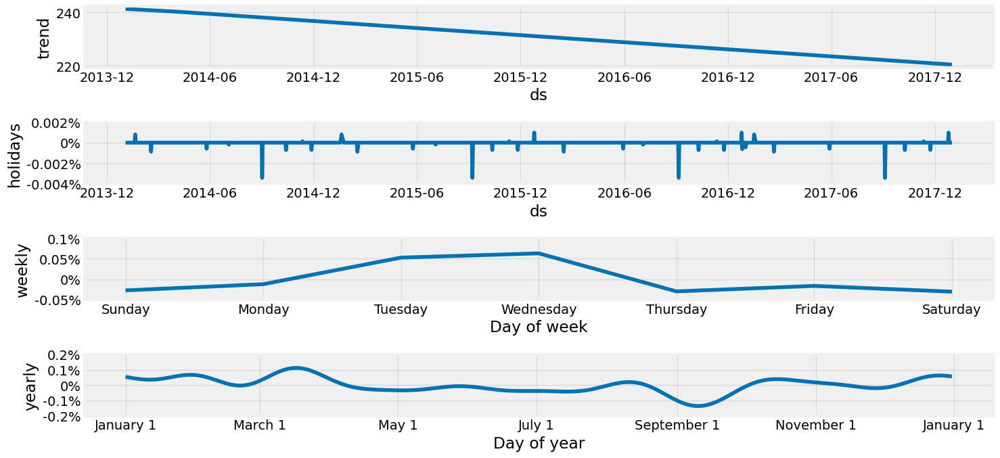

In [60]:
m = Prophet(**best_params)
m.add_country_holidays(country_name='US')
m.fit(df_train)
future = m.make_future_dataframe(periods=92, freq='D')
forecast = m.predict(future)
m.plot_components(forecast, figsize=(CFG.img_dim1, CFG.img_dim2))

In [62]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Christmas Day,Christmas Day_lower,Christmas Day_upper,Christmas Day (Observed),...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
0,2014-01-03,241.280979,-546.267800,1066.462695,241.280979,241.280979,0.0,0.0,0.0,0.0,...,-0.000164,-0.000164,-0.000164,0.000491,0.000491,0.000491,0.0,0.0,0.0,241.359933
1,2014-01-04,241.269567,-559.568604,1022.580679,241.269567,241.269567,0.0,0.0,0.0,0.0,...,-0.000304,-0.000304,-0.000304,0.000466,0.000466,0.000466,0.0,0.0,0.0,241.308642
2,2014-01-05,241.258155,-528.484938,1062.445002,241.258155,241.258155,0.0,0.0,0.0,0.0,...,-0.000273,-0.000273,-0.000273,0.000443,0.000443,0.000443,0.0,0.0,0.0,241.299172
3,2014-01-06,241.246743,-578.962322,1041.251179,241.246743,241.246743,0.0,0.0,0.0,0.0,...,-0.000121,-0.000121,-0.000121,0.000421,0.000421,0.000421,0.0,0.0,0.0,241.318903
4,2014-01-07,241.235331,-559.962785,1029.362003,241.235331,241.235331,0.0,0.0,0.0,0.0,...,0.000528,0.000528,0.000528,0.000401,0.000401,0.000401,0.0,0.0,0.0,241.459270
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1237,2017-12-27,220.526193,-591.728984,986.913692,220.514967,220.537946,0.0,0.0,0.0,0.0,...,0.000632,0.000632,0.000632,0.000621,0.000621,0.000621,0.0,0.0,0.0,220.802503
1238,2017-12-28,220.511736,-584.067696,1053.536397,220.500083,220.523633,0.0,0.0,0.0,0.0,...,-0.000298,-0.000298,-0.000298,0.000612,0.000612,0.000612,0.0,0.0,0.0,220.580977
1239,2017-12-29,220.497280,-511.941251,1029.311621,220.485575,220.509233,0.0,0.0,0.0,0.0,...,-0.000164,-0.000164,-0.000164,0.000598,0.000598,0.000598,0.0,0.0,0.0,220.593090
1240,2017-12-30,220.482824,-605.493745,960.276855,220.470816,220.494861,0.0,0.0,0.0,0.0,...,-0.000304,-0.000304,-0.000304,0.000581,0.000581,0.000581,0.0,0.0,0.0,220.543814


In [63]:
forecast[['ds', 'yhat', 'yhat_upper', 'yhat_lower']]

,ds,yhat,yhat_upper,yhat_lower
0,2014-01-03,241.359933,1066.462695,-546.267800
1,2014-01-04,241.308642,1022.580679,-559.568604
2,2014-01-05,241.299172,1062.445002,-528.484938
3,2014-01-06,241.318903,1041.251179,-578.962322
4,2014-01-07,241.459270,1029.362003,-559.962785
...,...,...,...,...
1237,2017-12-27,220.802503,986.913692,-591.728984
1238,2017-12-28,220.580977,1053.536397,-584.067696
1239,2017-12-29,220.593090,1029.311621,-511.941251
1240,2017-12-30,220.543814,960.276855,-605.493745


Covariates Example

In [87]:
df = pd.read_csv('datasets/GreenhouseClimate1.csv')
df["time"] = pd.to_datetime(df["time"], unit='D', origin='1899-12-30')
list1 = ['time', 'Tair']
list2 = ['co2_sp', 'dx_sp', 't_rail_min_sp', 't_grow_min_sp', \
        'assim_sp', 'scr_enrg_sp', 'scr_blck_sp', 't_heat_sp', \
        't_vent_sp', 'window_pos_lee_sp', 'water_sup_intervals_sp_min', \
        'int_blue_sp', 'int_red_sp', 'int_farred_sp', \
        'int_white_sp']

df = df[list1 + list2]
df1 = df.resample('H', on= 'time').mean().reset_index()[list1 + list2]
df1

,time,Tair,co2_sp,dx_sp,t_rail_min_sp,t_grow_min_sp,assim_sp,scr_enrg_sp,scr_blck_sp,t_heat_sp,t_vent_sp,window_pos_lee_sp,water_sup_intervals_sp_min,int_blue_sp,int_red_sp,int_farred_sp,int_white_sp
0,2019-12-16 00:00:00,21.391667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1000.0,0.0,0.0
1,2019-12-16 01:00:00,20.823077,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1000.0,0.0,0.0
2,2019-12-16 02:00:00,21.100000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1000.0,0.0,0.0
3,2019-12-16 03:00:00,20.900000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1000.0,0.0,0.0
4,2019-12-16 04:00:00,20.976923,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1000.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3980,2020-05-29 20:00:00,22.363636,300.0,2.2,0.0,33.636364,0.0,0.0,0.0,10.0,18.0,0.0,900.0,1000.0,1000.0,0.0,1000.0
3981,2020-05-29 21:00:00,19.825000,300.0,2.2,0.0,7.500000,0.0,0.0,0.0,10.0,18.0,0.0,900.0,1000.0,1000.0,0.0,1000.0
3982,2020-05-29 22:00:00,18.530769,300.0,2.2,0.0,0.000000,0.0,0.0,0.0,10.0,18.0,0.0,900.0,1000.0,1000.0,0.0,1000.0
3983,2020-05-29 23:00:00,18.127273,300.0,2.2,0.0,0.000000,0.0,0.0,0.0,10.0,18.0,0.0,900.0,1000.0,1000.0,0.0,1000.0


<AxesSubplot: >

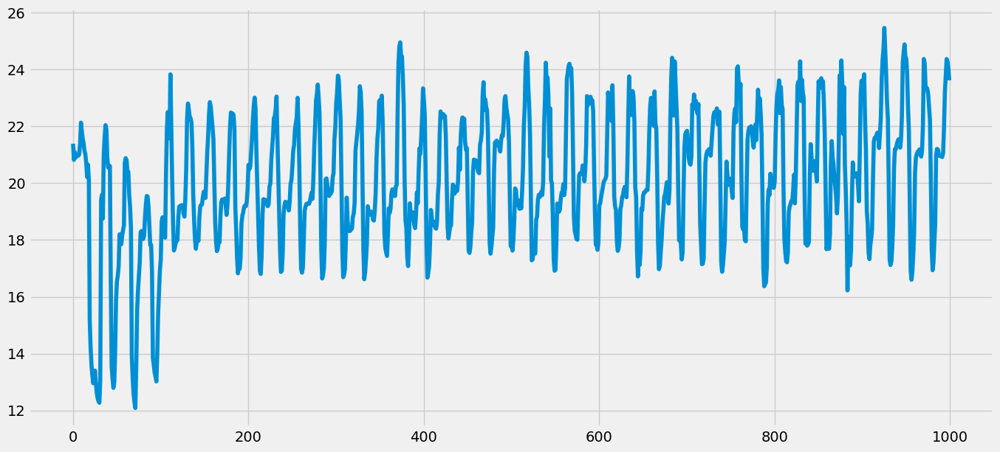

In [91]:
np.isnan(df1[['Tair'] + list2]).describe()
df1.dropna(subset=['Tair'], inplace=True)
df1['Tair'][0:1000].plot()

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -25.0512
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         10302     0.0300461       1467.08           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       10318.8    0.00676533       400.602           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       10323.4   0.000131353       107.828       0.199       0.617      364   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       10324.4    0.00108715       106.385       1.506      0.1506      490   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     448       10324.7   4.28999e-05       67.2829   1.586e-07       0.001      601  LS failed, Hessian reset 
     477       10324.7   1.42623e-05    

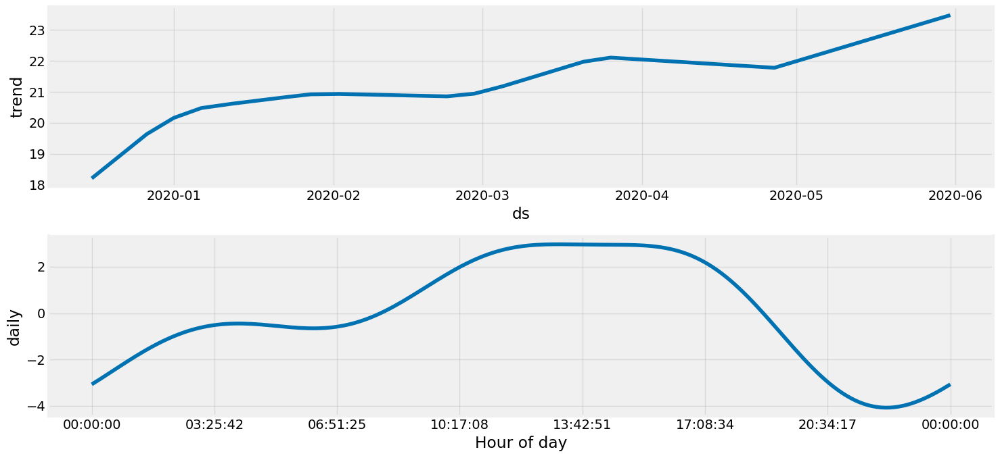

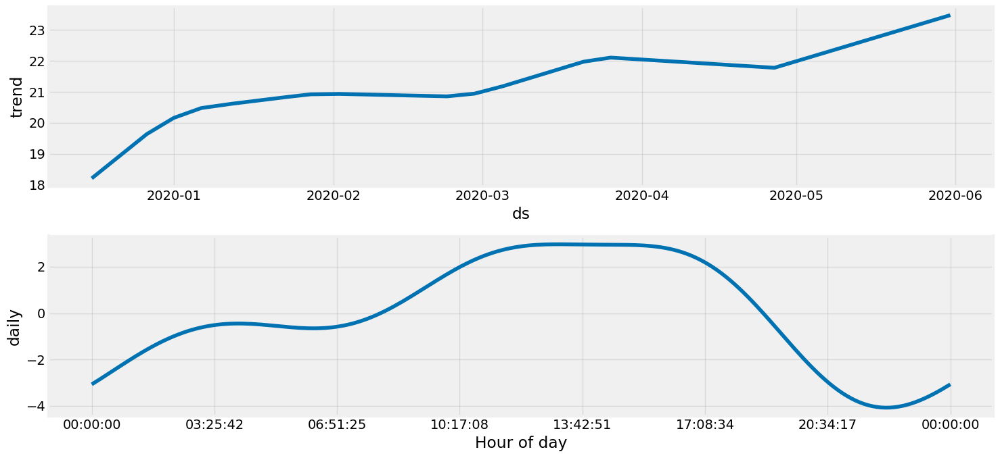

In [95]:
df = df1[['time', 'Tair']].rename(columns={'time':'ds', 'Tair':'y'})
m = Prophet(weekly_seasonality=False, interval_width=0.95)
m.fit(df)
future = m.make_future_dataframe(periods=24, freq='H')
forecast = m.predict(future)
m.plot_components(forecast, figsize=(CFG.img_dim1, CFG.img_dim2))

In [96]:
df_cv = cross_validation(m, initial='3700 hours', period='24 hours', horizon='24 hours')
df_p1 = performance_metrics(df_cv)
df_p1.head()

INFO:prophet:Making 11 forecasts with cutoffs between 2020-05-18 23:00:00 and 2020-05-28 23:00:00
  0%|                                                    | 0/11 [00:00<?, ?it/s]

Initial log joint probability = -24.5512
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       9414.07    0.00376362        217.21           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       9423.18    0.00467716       129.489           1           1      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       9429.25    0.00172917       172.751       2.114      0.2114      364   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     347       9429.71   3.18112e-05       53.9396   2.008e-07       0.001      466  LS failed, Hessian reset 
     399       9429.95    0.00468143       291.357      0.6287           1      534   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     436       9430.15    3.7078e-05    

  9%|████                                        | 1/11 [00:00<00:08,  1.14it/s]

Initial log joint probability = -24.4794
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        9441.2     0.0116221       415.068           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       9451.28     0.0185711       341.389      0.7608      0.7608      254   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     214       9452.03   8.93348e-05       170.038   2.131e-07       0.001      318  LS failed, Hessian reset 
     299       9456.04    0.00024361       55.7715      0.1946           1      424   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       9457.55   0.000513908       129.615      0.4355           1      556   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     409       9457.59    3.2187e-05    

 18%|████████                                    | 2/11 [00:01<00:08,  1.10it/s]

09  LS failed, Hessian reset 
     465       9457.67   0.000191741       236.721    2.56e-06       0.001      722  LS failed, Hessian reset 
     499       9457.71   0.000113923        66.254      0.9629      0.9629      763   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     571       9457.83   4.95705e-05       113.082   2.475e-07       0.001      890  LS failed, Hessian reset 
     599       9457.91   3.50475e-05       46.2193      0.9834      0.9834      921   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     622       9457.91    2.7117e-07       47.5293       0.174      0.6752      954   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -21.2404
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       9524.78    0.00256039       193.832           1  

 27%|████████████                                | 3/11 [00:02<00:07,  1.13it/s]

Initial log joint probability = -15.5778
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       9914.29    0.00102838        334.07      0.5033      0.5033      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       9927.02    0.00471809        592.13           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     257        9929.1   2.07864e-05       58.3368   1.945e-07       0.001      367  LS failed, Hessian reset 
     299       9929.48   0.000179509       212.883      0.3798      0.3798      421   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       9930.72   0.000136617       80.6976        0.47           1      556   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     485       9930.87   5.61769e-05    

 36%|████████████████                            | 4/11 [00:03<00:06,  1.14it/s]

99  LS failed, Hessian reset 
     499       9930.95   0.000328944       76.4524      0.5731      0.5731      717   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     549       9930.99   3.04325e-05       94.7691   2.832e-07       0.001      841  LS failed, Hessian reset 
     558       9930.99   7.20859e-07        47.009      0.2695           1      855   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -20.6792
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       9967.22    0.00290328       275.193      0.6645      0.6645      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       9980.63   0.000494008       284.901           1           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Not

 45%|████████████████████                        | 5/11 [00:04<00:05,  1.16it/s]

Initial log joint probability = -22.7955
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         10021    0.00479573       697.761      0.3159           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       10035.3    0.00291505       155.515           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       10039.9   0.000885205       107.638           1           1      361   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         10041   0.000565933       89.7987      0.8278      0.8278      483   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     415       10041.2   6.97562e-05       160.902   6.292e-07       0.001      541  LS failed, Hessian reset 
     487       10041.4   3.36361e-05    

 55%|████████████████████████                    | 6/11 [00:05<00:04,  1.12it/s]

Initial log joint probability = -21.7671
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       10067.1    0.00259654       441.494           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       10085.2    0.00199657       261.175       0.429           1      245   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       10089.4   0.000914718       80.9932       1.292      0.1771      369   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     314       10089.4   0.000245916       104.443    3.64e-06       0.001      420  LS failed, Hessian reset 
     399       10089.7   0.000394447       79.8003           1           1      529   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     479       10089.8   4.12707e-05    

 64%|████████████████████████████                | 7/11 [00:06<00:03,  1.10it/s]

Initial log joint probability = -20.3784
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       10122.4    0.00258179       546.432       1.299      0.1299      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       10138.1    0.00463267       239.474       2.639      0.2639      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       10143.3   0.000296986       153.635      0.6951      0.6951      361   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     314       10143.5   4.43786e-05       94.5774   1.656e-07       0.001      419  LS failed, Hessian reset 
     397       10144.2   0.000104739       295.422   4.515e-07       0.001      580  LS failed, Hessian reset 
     399       10144.3   0.000299206       115.264           1           1      582   
    Iter      log pro

 73%|████████████████████████████████            | 8/11 [00:07<00:02,  1.12it/s]

Initial log joint probability = -18.8779
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       10173.6     0.0128187       811.774           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       10187.9    0.00448119       516.655           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     276       10194.3    6.0493e-05       153.633   5.211e-07       0.001      379  LS failed, Hessian reset 
     299         10195     0.0018549       485.317           1           1      405   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     371       10195.9   3.30045e-05       107.014   2.444e-07       0.001      544  LS failed, Hessian reset 
     399         10196   2.14043e-05       59.4016      0.7596      0.7596      582   
    Iter      log pro

 82%|████████████████████████████████████        | 9/11 [00:08<00:01,  1.10it/s]

Initial log joint probability = -21.4872


 91%|███████████████████████████████████████    | 10/11 [00:09<00:00,  1.02it/s]

    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       10228.4     0.0197986       765.464           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       10241.3     0.0105431       486.184      0.3098           1      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     248       10244.3   9.94432e-05       288.767   4.536e-07       0.001      350  LS failed, Hessian reset 
     299         10247   0.000264497       144.154           1           1      413   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       10248.5    0.00046739       121.276      0.1107      0.9898      537   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       10249.1   0.000721005       128.099      0.6638      0.6638      6

100%|███████████████████████████████████████████| 11/11 [00:10<00:00,  1.05it/s]


,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,0 days 03:00:00,4.335039,2.082076,1.869774,0.096938,0.097631,0.092091,0.870629
1,0 days 04:00:00,5.189832,2.278120,2.070221,0.105204,0.101834,0.099237,0.793706
2,0 days 05:00:00,5.897060,2.428386,2.218115,0.111400,0.115200,0.104603,0.741259
3,0 days 06:00:00,6.248647,2.499729,2.291627,0.114816,0.115445,0.107618,0.727273
4,0 days 07:00:00,5.435283,2.331369,2.120691,0.105474,0.115700,0.099367,0.804196


In [102]:
df1 = df1.dropna()
estimator = Ridge()
selector = RFECV(estimator, step=10, cv=10)
selector = selector.fit(df1[list2], df1['Tair'])

In [103]:
to_keep = df1[list2].columns[selector.support_]

In [104]:
to_keep

Index(['dx_sp', 't_rail_min_sp', 't_heat_sp', 't_vent_sp',
       'window_pos_lee_sp'],
      dtype='object')

In [105]:
df = df1[['time', 'Tair']].rename(columns={'time':'ds', 'Tair':'y'})
m = Prophet(weekly_seasonality=False, interval_width=0.95)

for f in to_keep:
    df[f] = df1[f]
    m.add_regressor(f)
    
m.fit(df)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Initial log joint probability = -33.0434
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       12360.2   0.000298638       465.311           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       12367.3   0.000890939       268.863           1           1      224   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       12369.7    0.00375998       608.743      0.3651           1      335   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       12370.7   0.000260891       174.422           1           1      448   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       12371.3   0.000263919       181.422      0.1779      0.8221      561   
    Iter      log prob        ||dx||      ||grad||       alpha  

  12372.8   0.000136655       334.748           1           1      670   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       12373.2   1.13887e-05       94.0384       0.604       0.604      776   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       12373.6   3.53855e-05        76.714      0.2654           1      896   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     827       12373.6   1.16745e-05       142.306    1.18e-07       0.001      979  LS failed, Hessian reset 
     899       12373.7   8.90644e-05       165.951      0.4662      0.4662     1072   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       12373.8   0.000210901       185.943           1           1     1195   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    108

In [106]:
df_cv = cross_validation(m, initial='3700 hours', period='24 hours', horizon='24 hours')
df_p2 = performance_metrics(df_cv)

INFO:prophet:Making 7 forecasts with cutoffs between 2020-05-22 23:00:00 and 2020-05-28 23:00:00
  0%|                                                     | 0/7 [00:00<?, ?it/s]

Initial log joint probability = -27.0123
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       11858.5    0.00393041       1910.58           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       11866.8    0.00037182       678.018           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       11869.6   0.000164981       131.826      0.2022           1      345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     300       11869.6   1.03497e-05       101.673   7.851e-08       0.001      392  LS failed, Hessian reset 
     399       11870.4   0.000100254       216.032      0.9102      0.9102      506   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       11872.1   0.000268969    

 14%|██████▍                                      | 1/7 [00:01<00:08,  1.43s/it]

9       11876.6   3.83763e-05       61.5772      0.8478      0.8478     1294   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1105       11876.7   1.28307e-05       79.1538   1.765e-07       0.001     1345  LS failed, Hessian reset 
    1199       11876.7   6.12013e-05       102.989           1           1     1446   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       11876.8   0.000103785       95.5985           1           1     1556   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1356       11876.9   1.49589e-06       71.4174      0.5129      0.5129     1623   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probability = -30.0071
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       11948.6    0.00190

 29%|████████████▊                                | 2/7 [00:02<00:06,  1.39s/it]

Initial log joint probability = -28.5996
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       12008.5    0.00105433       1776.35      0.5104      0.5104      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       12018.4    0.00144078       448.448           1           1      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       12019.8   0.000182291       217.751      0.4659      0.4659      343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         12021   0.000276868       244.071           1           1      450   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       12021.5   0.000604933       312.032           1           1      566   
    Iter      log prob        ||dx||      ||grad||       alpha  

 43%|███████████████████▎                         | 3/7 [00:04<00:06,  1.53s/it]

Initial log joint probability = -26.5056
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       12097.8     0.0010896       613.863           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       12103.6    0.00178297       795.507           1           1      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       12104.9   0.000192914       263.058      0.6895      0.6895      345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       12105.8   0.000330401       229.805           1           1      450   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       12107.4    0.00206422       560.411           1           1      564   
    Iter      log prob        ||dx||      ||grad||       alpha  

 57%|█████████████████████████▋                   | 4/7 [00:05<00:04,  1.43s/it]

Initial log joint probability = -24.0684
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       12178.4    0.00793281       2210.93           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       12186.9   0.000410318       899.902           1           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299         12189   0.000502071        522.04      0.5839      0.5839      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       12190.1   5.41637e-05       201.267       0.722       0.722      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       12190.8    0.00148048       512.673           1           1      572   
    Iter      log prob        ||dx||      ||grad||       alpha  

 71%|████████████████████████████████▏            | 5/7 [00:06<00:02,  1.33s/it]

Initial log joint probability = -28.0731
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       12248.2    0.00154247       1557.14       0.655       0.655      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       12256.5    0.00039599       466.684      0.2439           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       12258.7    0.00236546       821.335           1           1      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       12260.4   0.000275197       1112.21      0.5367      0.5367      451   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       12262.2   0.000239764       330.717      0.3677      0.3677      567   
    Iter      log prob        ||dx||      ||grad||       alpha  

 86%|██████████████████████████████████████▌      | 6/7 [00:08<00:01,  1.33s/it]

Initial log joint probability = -23.3532
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       12307.6     0.0046671       965.406           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       12313.3   0.000102883       235.641           1           1      228   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       12315.9   0.000505222       391.232           1           1      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399         12318     0.0015275       527.761           1           1      444   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       12318.6   2.11993e-05       114.853      0.4469      0.4469      561   
    Iter      log prob        ||dx||      ||grad||       alpha  

100%|█████████████████████████████████████████████| 7/7 [00:09<00:00,  1.42s/it]

    1250  LS failed, Hessian reset 
     999       12320.6   3.19203e-05       101.353           1           1     1282   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1074       12320.7   3.85246e-05       342.929   1.769e-07       0.001     1409  LS failed, Hessian reset 
    1099       12320.8   6.94957e-05       152.999      0.9062      0.9062     1439   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1130       12320.8   1.90621e-05       169.057    1.97e-07       0.001     1520  LS failed, Hessian reset 
    1190       12320.9   1.19101e-05       109.531   1.194e-07       0.001     1643  LS failed, Hessian reset 
    1199       12320.9   9.22384e-06       82.9091      0.7683      0.7683     1652   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1220       12320.9   7.39977e-07       84.8856       0.305           1     1678   
Optimiz

In [107]:
comparison = pd.DataFrame()
comparison['raw'] = df_p1.mean(axis=0)[1:]
comparison['covariates'] = df_p2.mean(axis=0)[1:]

In [108]:
comparison

,raw,covariates
mse,9.378557,1.101235
rmse,2.801597,0.989049
mae,2.340098,0.738334
mape,0.095255,0.03381
mdape,0.086317,0.023138
smape,0.098645,0.033116
coverage,0.71138,0.852679


Neural Prophet Example

<AxesSubplot: xlabel='ds'>

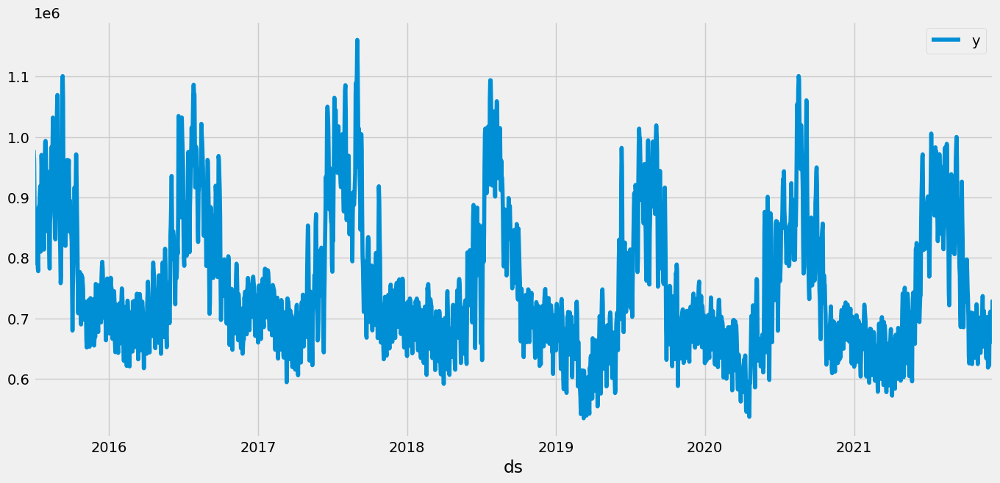

In [113]:
df = pd.read_excel('datasets/Region_CAL.xlsx', sheet_name='Published Daily Data', header=0, usecols=['Local date', 'D'])
df.columns = ['ds', 'y']
df['ds'] = pd.to_datetime(df['ds'])
df.plot(x='ds', y='y')

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -18.5191
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       5224.31     0.0061187       325.003       0.408           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       5228.96   3.49585e-05       64.3844           1           1      253   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     206       5228.98   7.98759e-05       125.208    8.84e-07       0.001      302  LS failed, Hessian reset 
     232          5229   8.08015e-08       57.8347     0.06794           1      343   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


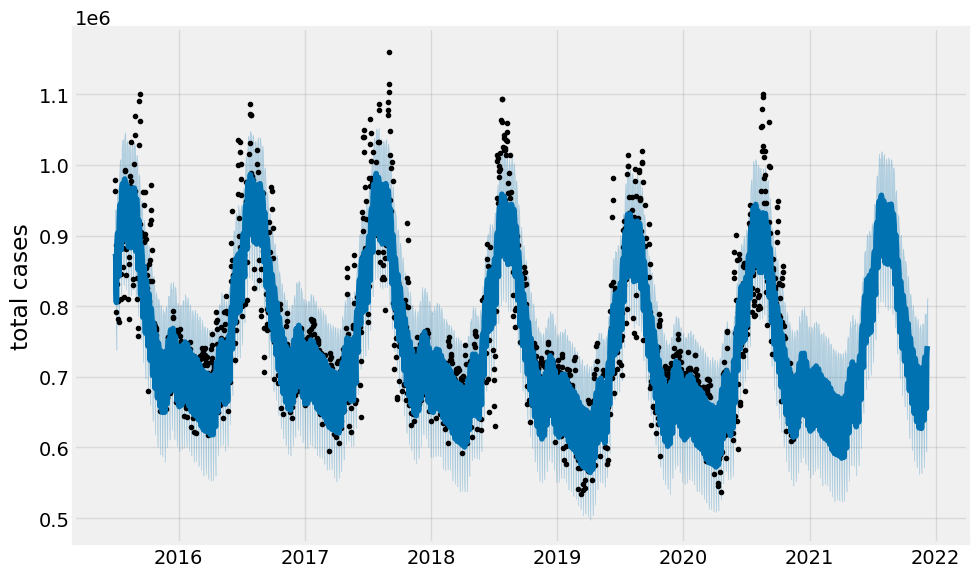

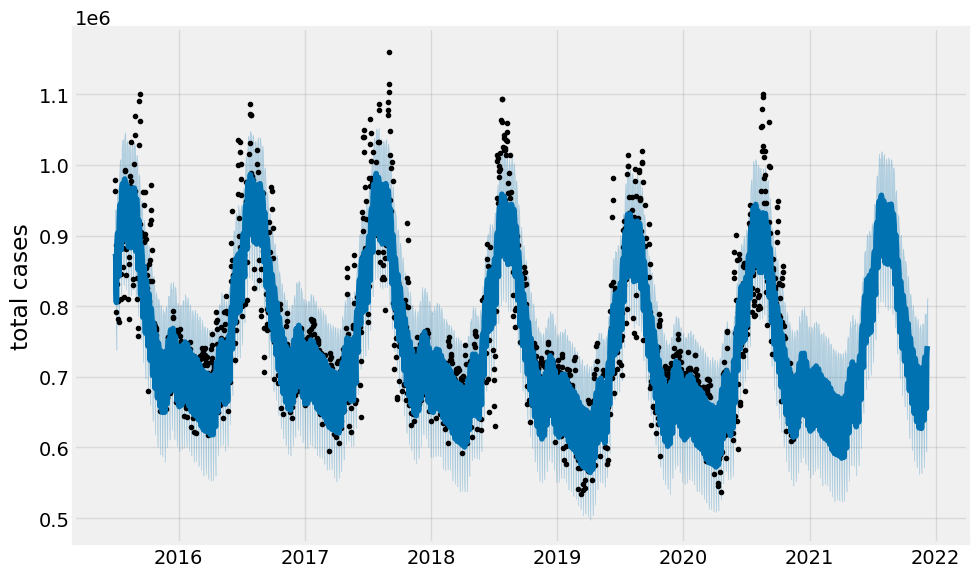

In [116]:
df_train, df_test = df.iloc[:-365], df.iloc[-365:]
m_vanilla = Prophet()
m_vanilla.fit(df_train)
future = m_vanilla.make_future_dataframe(periods=365)
forcast_vanilla = m_vanilla.predict(future)

m_vanilla.plot(forcast_vanilla, xlabel='', ylabel='total cases')

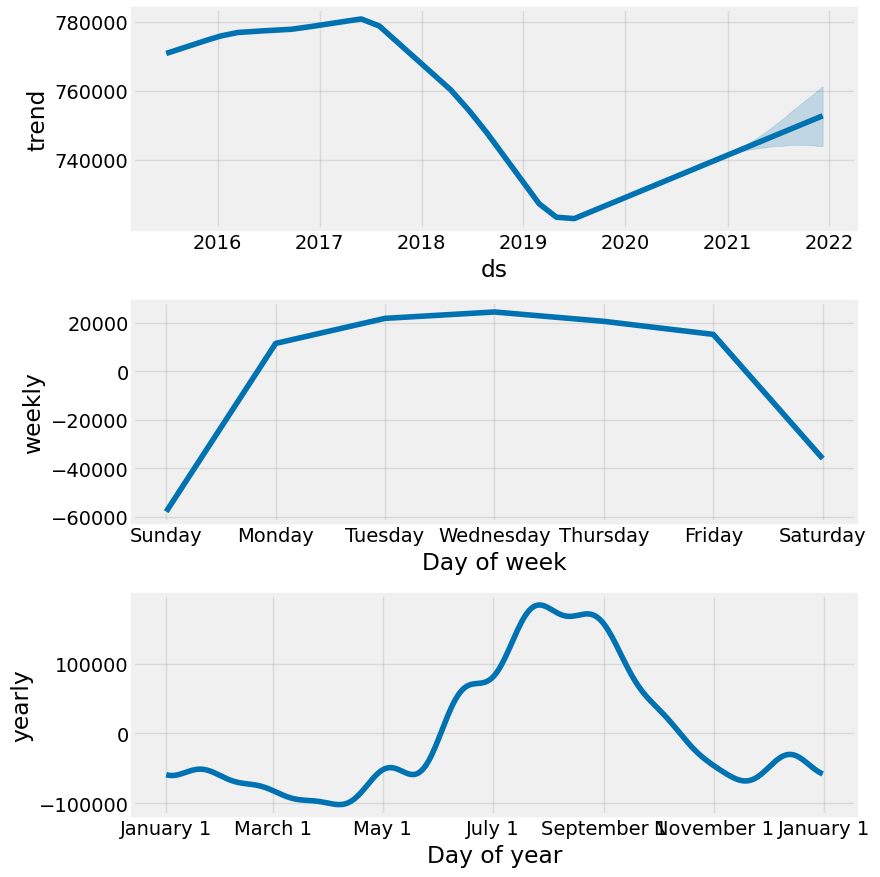

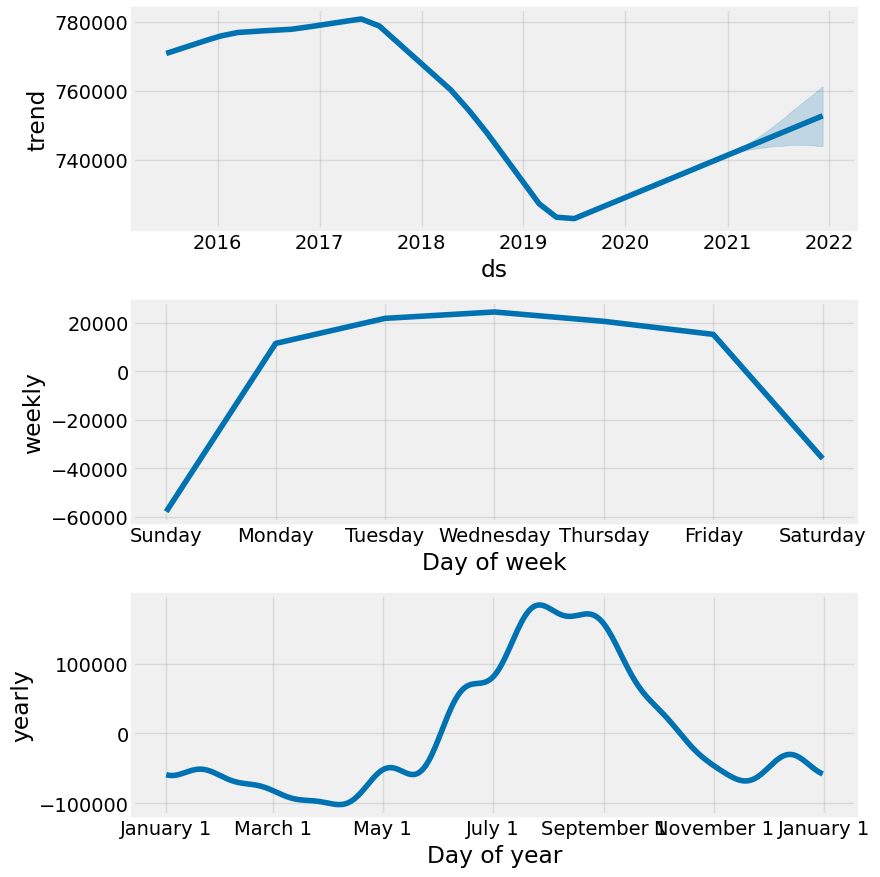

In [118]:
m_vanilla.plot_components(forcast_vanilla)

In [119]:
from neuralprophet import NeuralProphet
pd.options.mode.chained_assignment = None
m_neural = NeuralProphet()
metrics = m_neural.fit(df_train, 'D')

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.95% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.95% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 158
INFO:NP.config:Auto-set epochs to 158
100%|█████████████

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.95% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.95% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.726% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.726% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.726% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 99.726% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is e

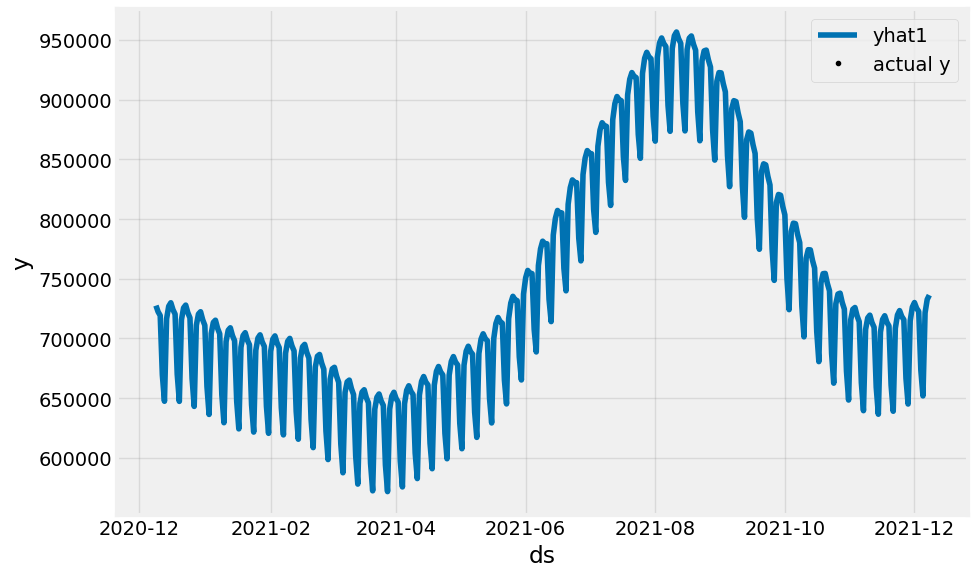

In [120]:
df_future = m_neural.make_future_dataframe(df_train, periods=365)
forecast_neural = m_neural.predict(df_future)
fig_forecast = m_neural.plot(forecast_neural)

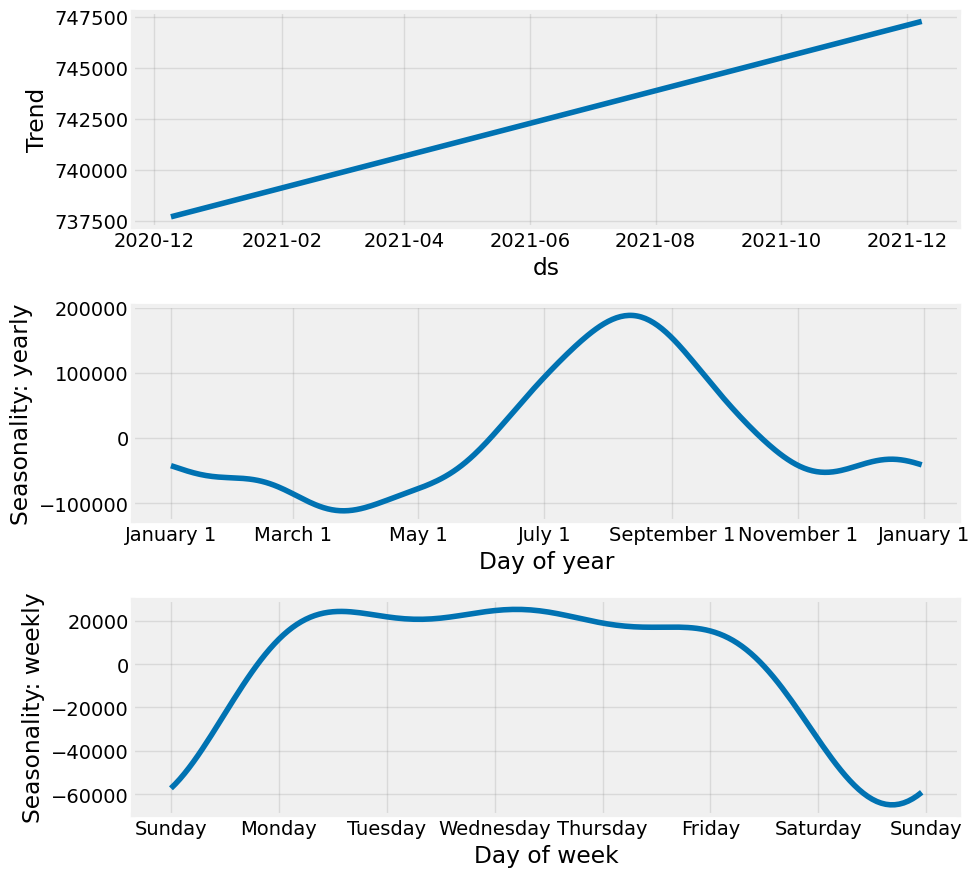

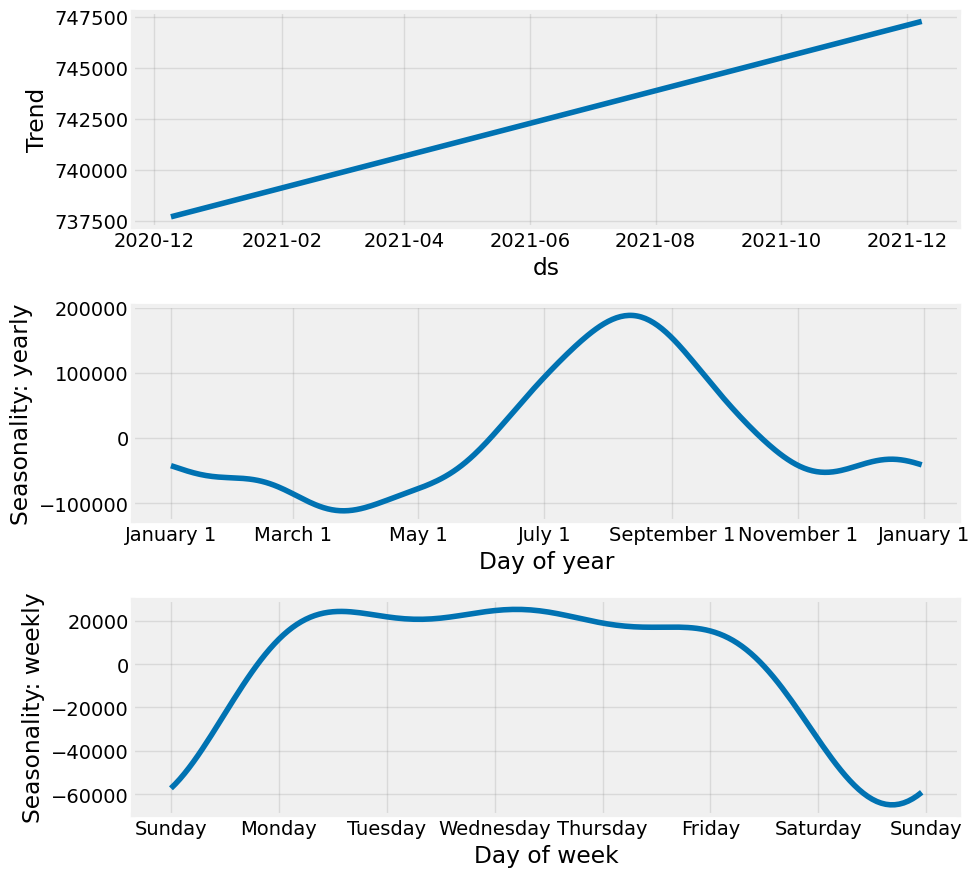

In [121]:
m_neural.plot_components(forecast_neural)

In [125]:
df_test['forecast_vanilla'] = forcast_vanilla.yhat.tail(365).values
df_test['forecast_neural']  = forecast_neural.yhat1.values

In [126]:
from sklearn.metrics import mean_squared_error as mse, median_absolute_error as mae

def my_mse(x, y):
    return np.round(np.sqrt(mse(x,y)),2)

def my_mae(x, y):
    return np.round(np.sqrt(mae(x, y)), 2)

In [129]:
df_test = df_test.dropna()
df_test

,ds,y,forecast_vanilla,forecast_neural
1988,2020-12-09,710429.0,732908.500877,727536.1250
1989,2020-12-10,710700.0,730068.845443,722368.0000
1990,2020-12-11,726307.0,725380.299333,719210.7500
1991,2020-12-12,686201.0,674427.743256,669539.8750
1992,2020-12-13,664552.0,652557.026428,647405.1250
...,...,...,...,...
2347,2021-12-03,705647.0,723846.686789,722627.3750
2348,2021-12-04,672302.0,674906.969153,673463.8750
2349,2021-12-05,660922.0,655257.336019,651884.7500
2350,2021-12-06,728081.0,726878.688428,721531.7500


In [133]:
err1 = my_mae(df_test['y'], df_test['forecast_vanilla'])
err2 = my_mae(df_test['y'], df_test['forecast_neural'])

In [134]:
err1

141.59

In [135]:
err2

149.3